### Same Polarization

#### With fixed 1064nm and varied 975nm powers

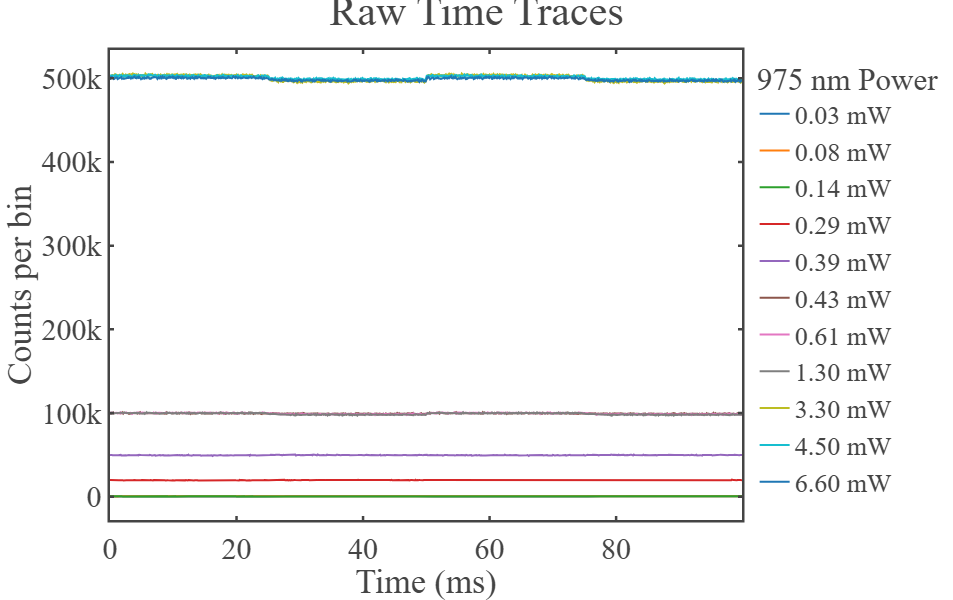

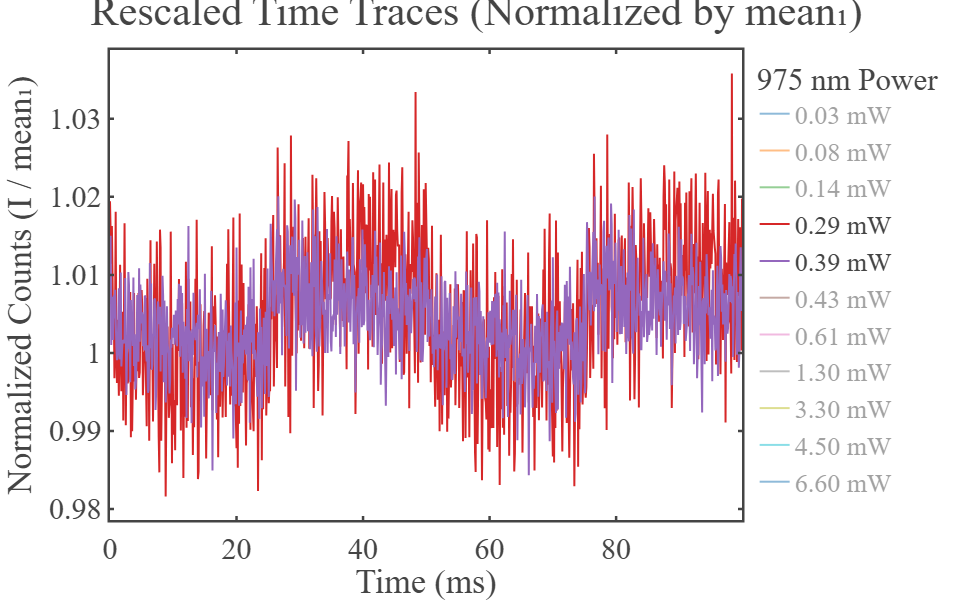

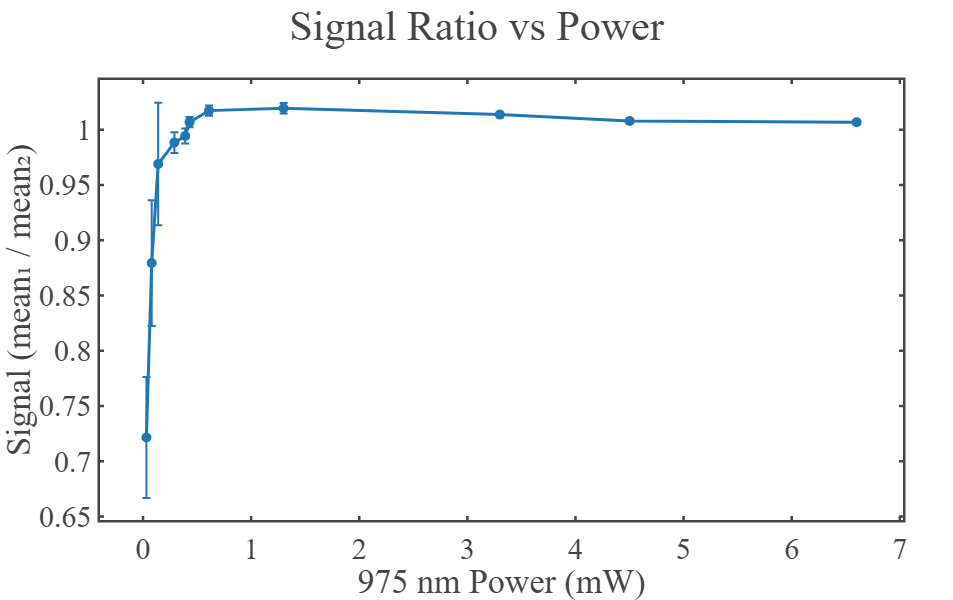

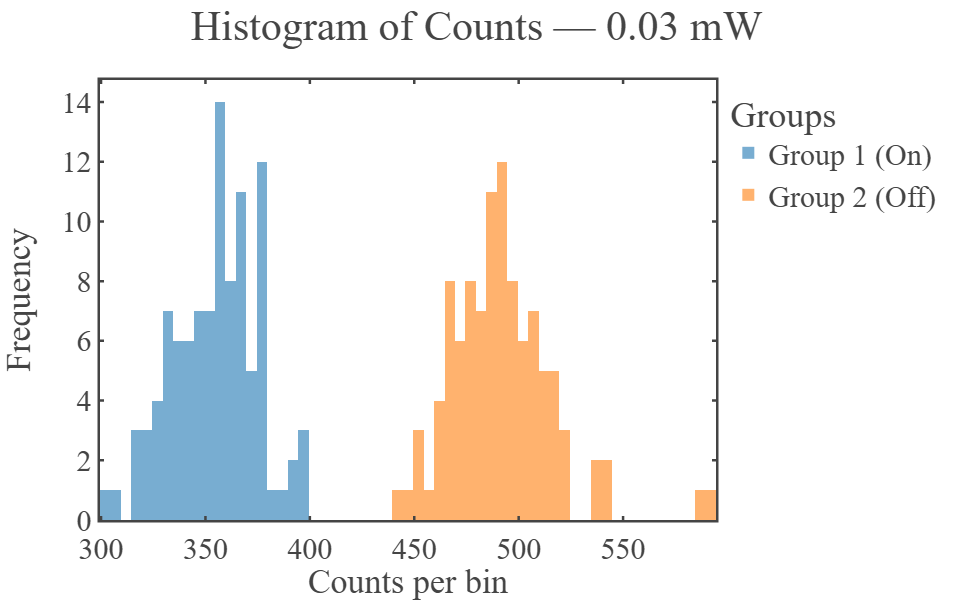

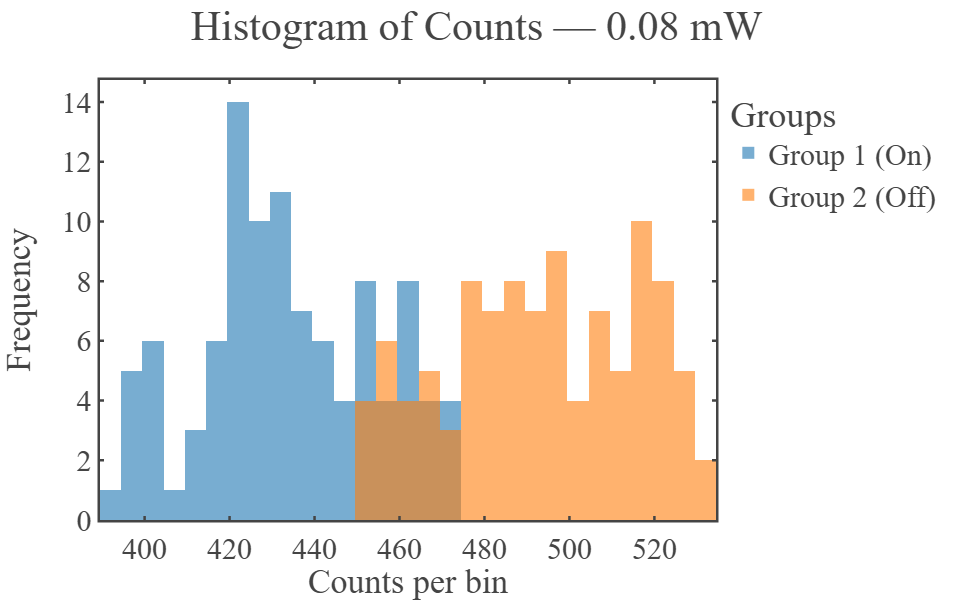

...

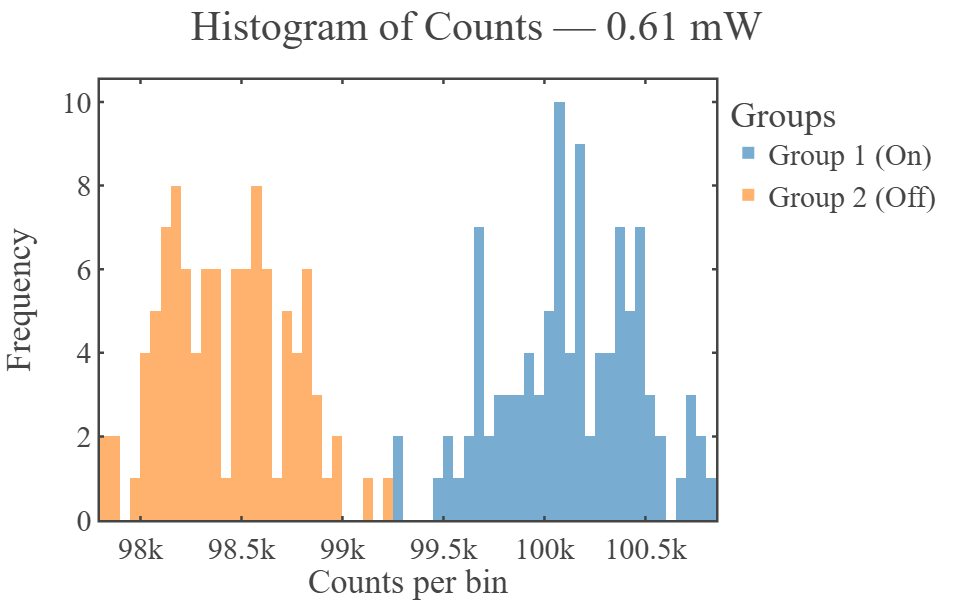

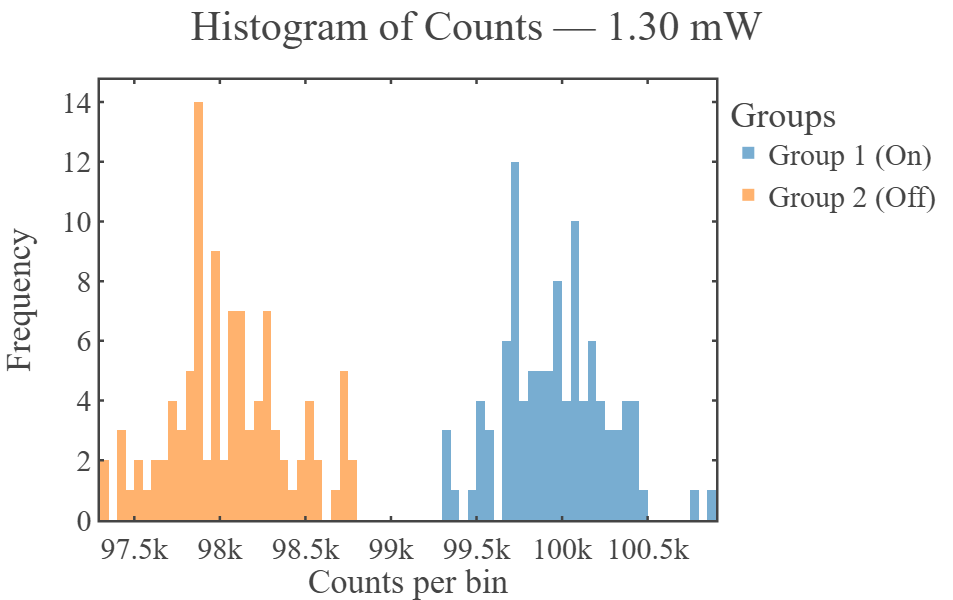

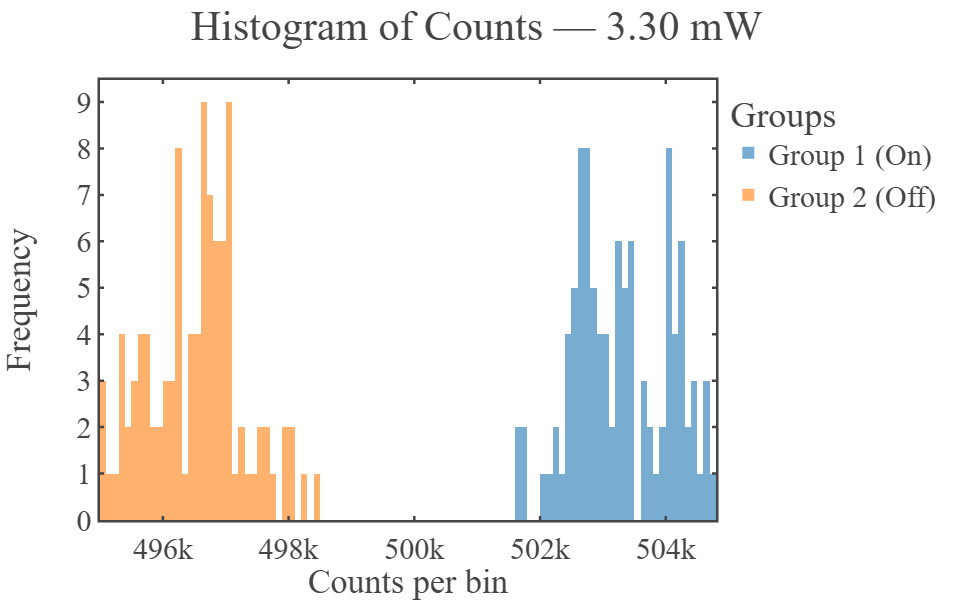

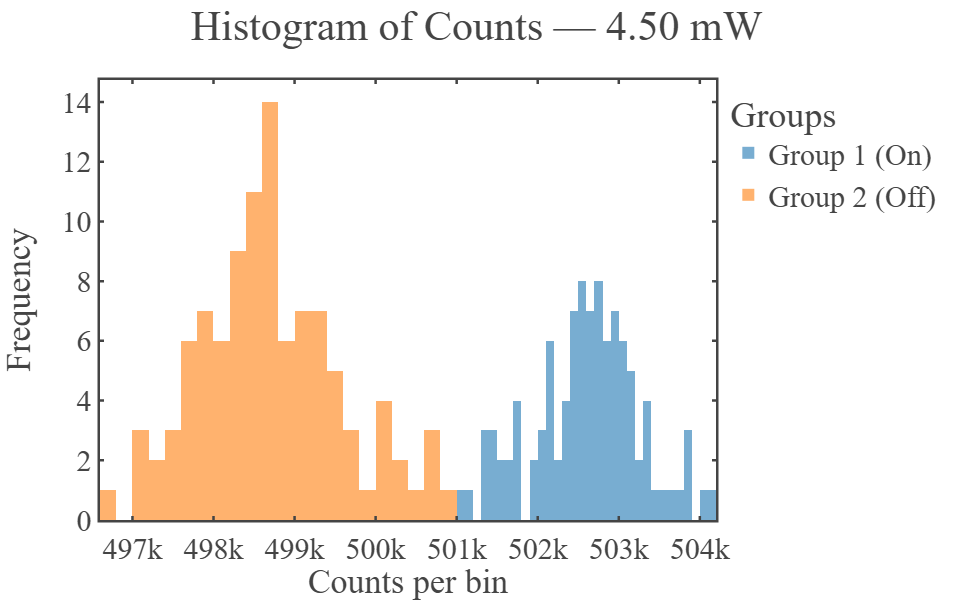

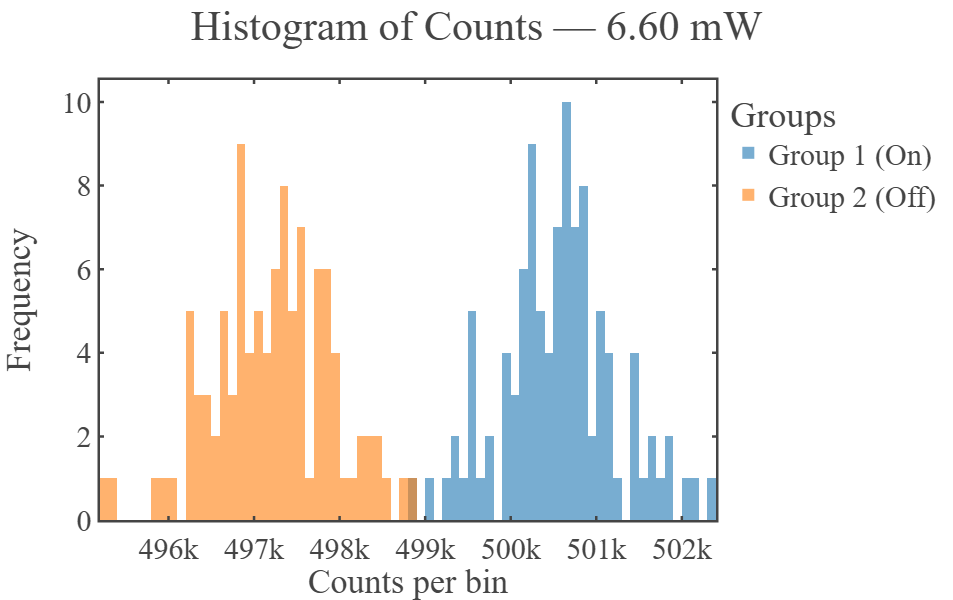

,Power (mW),Mean1,Mean2,Std1,Std2,Signal,Signal_std
0,0.031,354.705882,491.666667,20.091745,24.791022,0.721436,0.054710
1,0.080,433.745098,493.294118,20.273467,22.105180,0.879283,0.056935
2,0.140,469.323529,484.401961,18.684775,19.891993,0.968872,0.055415
3,0.290,19735.225490,19968.352941,137.614117,130.585683,0.988325,0.009448
4,0.390,49494.450980,49780.941176,250.026494,226.445112,0.994245,0.006759
5,0.430,99797.382353,99121.882353,331.825286,303.985626,1.006815,0.004554
6,0.610,100126.117647,98429.529412,341.759642,302.875394,1.017237,0.004675
7,1.300,99959.127451,98058.980392,302.257606,342.596429,1.019378,0.004710
8,3.300,503288.862745,496527.225490,763.742424,755.291775,1.013618,0.002178
9,4.500,502592.441176,498702.892157,660.088104,878.578095,1.007799,0.002215


In [21]:
import os
import re
import numpy as np
import pandas as pd
import plotly.graph_objects as go

# ============================================================
# 1️⃣ --- Folder path ---
# ============================================================
folder_path = r"C:\Users\Atanu\OneDrive\Desktop\research_work\paper\NaBiF4_PL_analysis\datas\6th Oct NaBiF4\1064nm_3.86mW_same_polarization\face on"

# ============================================================
# 2️⃣ --- Power calibration mapping (source → sample plane mW) ---
# ============================================================
calibration_dict = {
    0:0, 1:0.031, 2:0.08, 3:0.14, 4:0.19, 5:0.29, 6:0.39, 7:0.43, 8:0.47, 9:0.61,
    10:0.61, 20:1.3, 30:2.3, 50:3.3, 70:4.5, 90:6.6, 110:9.4, 130:10.1,
    150:12.5, 170:14.3, 190:16.1, 210:18.7, 230:21.3, 250:22.3, 270:25.7, 300:22.34
}

# ============================================================
# 3️⃣ --- Custom Plotly template ---
# ============================================================
fig_template = go.layout.Template()
fig_template.layout = {
    'template': 'simple_white+presentation',
    'autosize': False,
    'width': 800,
    'height': 600,
    'xaxis': {'ticks':'inside','mirror':'ticks','linewidth':2.5,'tickwidth':2.5,
              'ticklen':4,'showline':True,'showgrid':False,'zerolinecolor':'white',
              'titlefont':dict(size=34),'tickfont':dict(size=30)},
    'yaxis': {'ticks':'inside','mirror':'ticks','linewidth':2.5,'tickwidth':2.5,
              'ticklen':4,'showline':True,'showgrid':False,'zerolinecolor':'white',
              'titlefont':dict(size=34),'tickfont':dict(size=30)},
    'font': {'family': 'mathjax', 'size': 30}
}

# ============================================================
# 4️⃣ --- Helper: extract calibrated 975 nm power from filename ---
# ============================================================
def extract_calibrated_power(filename):
    match = re.search(r'975nm_(\d+(?:\.\d+)?)mW', filename)
    if match:
        src_power = float(match.group(1))
        nearest_key = min(calibration_dict.keys(), key=lambda k: abs(k - src_power))
        return calibration_dict[nearest_key]
    return None

# ============================================================
# 5️⃣ --- Gather and sort files by calibrated power ---
# ============================================================
file_data = []
for file_name in os.listdir(folder_path):
    if file_name.endswith(('.txt', '.csv')):
        cal_power = extract_calibrated_power(file_name)
        if cal_power is not None:
            file_data.append((file_name, cal_power))
file_data.sort(key=lambda x: x[1])

# ============================================================
# 6️⃣ --- Plot all traces (raw + rescaled) and store group data ---
# ============================================================
groups = [(15,20), (40,45), (65,70), (90,95)]
results = []
histogram_data = {}  # Store group1/group2 arrays per power

# --- (a) Unscaled traces ---
fig_raw = go.Figure()

# --- (b) Rescaled traces ---
fig_rescaled = go.Figure()

for file_name, cal_power in file_data:
    file_path = os.path.join(folder_path, file_name)
    data = pd.read_csv(file_path, sep=None, engine='python')

    if "Time (ps)" in data.columns:
        data["Time (ms)"] = data["Time (ps)"] * 1e-9
    elif "Time (ms)" not in data.columns:
        continue

    # Extract groups
    y_groups = []
    for tmin, tmax in groups:
        mask = (data["Time (ms)"] >= tmin) & (data["Time (ms)"] <= tmax)
        y_groups.append(data.loc[mask, "Counts per bin"].values)

    if any(len(y)==0 for y in y_groups):
        continue

    group1 = np.concatenate([y_groups[0], y_groups[2]])
    group2 = np.concatenate([y_groups[1], y_groups[3]])

    histogram_data[cal_power] = (group1, group2)

    mean1, std1 = np.mean(group1), np.std(group1)
    mean2, std2 = np.mean(group2), np.std(group2)

    signal = mean1 / mean2 if mean2 != 0 else np.nan
    signal_std = signal * np.sqrt((std1/mean1)**2 + (std2/mean2)**2) if mean1>0 and mean2>0 else np.nan
    results.append((cal_power, mean1, mean2, std1, std2, signal, signal_std))

    # --- (a) Raw trace ---
    fig_raw.add_trace(go.Scatter(
        x=data["Time (ms)"],
        y=data["Counts per bin"],
        mode='lines',
        name=f"{cal_power:.2f} mW"
    ))

    # --- (b) Rescaled trace (normalized by mean1) ---
    if mean1 != 0:
        scaled_y = data["Counts per bin"] / mean1
        fig_rescaled.add_trace(go.Scatter(
            x=data["Time (ms)"],
            y=scaled_y,
            mode='lines',
            name=f"{cal_power:.2f} mW"
        ))

# ============================================================
# 7️⃣ --- Layout updates for both plots ---
# ============================================================
fig_raw.update_layout(
    template=fig_template,
    xaxis_title="Time (ms)",
    yaxis_title="Counts per bin",
    legend_title="975 nm Power",
    legend=dict(font=dict(size=26)),
    width=900,
    height=600,
    margin=dict(l=110, r=50, t=50, b=80),
    title="Raw Time Traces"
)

fig_rescaled.update_layout(
    template=fig_template,
    xaxis_title="Time (ms)",
    yaxis_title="Normalized Counts (I / mean₁)",
    legend_title="975 nm Power",
    legend=dict(font=dict(size=26)),
    width=900,
    height=600,
    margin=dict(l=110, r=50, t=50, b=80),
    title="Rescaled Time Traces (Normalized by mean₁)"
)

fig_raw.show()
fig_rescaled.show()

# ============================================================
# 8️⃣ --- DataFrame + Signal vs Power plot ---
# ============================================================
results_df = pd.DataFrame(results, columns=["Power (mW)", "Mean1", "Mean2", "Std1", "Std2", "Signal", "Signal_std"])

fig_signal = go.Figure()
fig_signal.add_trace(go.Scatter(
    x=results_df["Power (mW)"],
    y=results_df["Signal"],
    error_y=dict(type='data', array=results_df["Signal_std"], visible=True),
    mode='markers+lines',
    marker=dict(size=10),
    line=dict(width=3),
    name="Signal Ratio"
))

fig_signal.update_layout(
    template=fig_template,
    xaxis_title="975 nm Power (mW)",
    yaxis_title="Signal (mean₁ / mean₂)",
    legend_title="Data",
    width=900,
    height=600,
    margin=dict(l=100, r=50, t=80, b=80),
    title="Signal Ratio vs Power"
)
fig_signal.show()

# ============================================================
# 9️⃣ --- Histograms for each power ---
# ============================================================
for cal_power, (group1, group2) in histogram_data.items():
    fig_hist = go.Figure()

    fig_hist.add_trace(go.Histogram(
        x=group1,
        name="Group 1 (On)",
        opacity=0.6,
        nbinsx=40
    ))

    fig_hist.add_trace(go.Histogram(
        x=group2,
        name="Group 2 (Off)",
        opacity=0.6,
        nbinsx=40
    ))

    fig_hist.update_layout(
        template=fig_template,
        barmode='overlay',
        xaxis_title="Counts per bin",
        yaxis_title="Frequency",
        legend_title="Groups",
        title=f"Histogram of Counts — {cal_power:.2f} mW",
        width=900,
        height=600,
        margin=dict(l=100, r=50, t=80, b=80)
    )

    fig_hist.show()

results_df


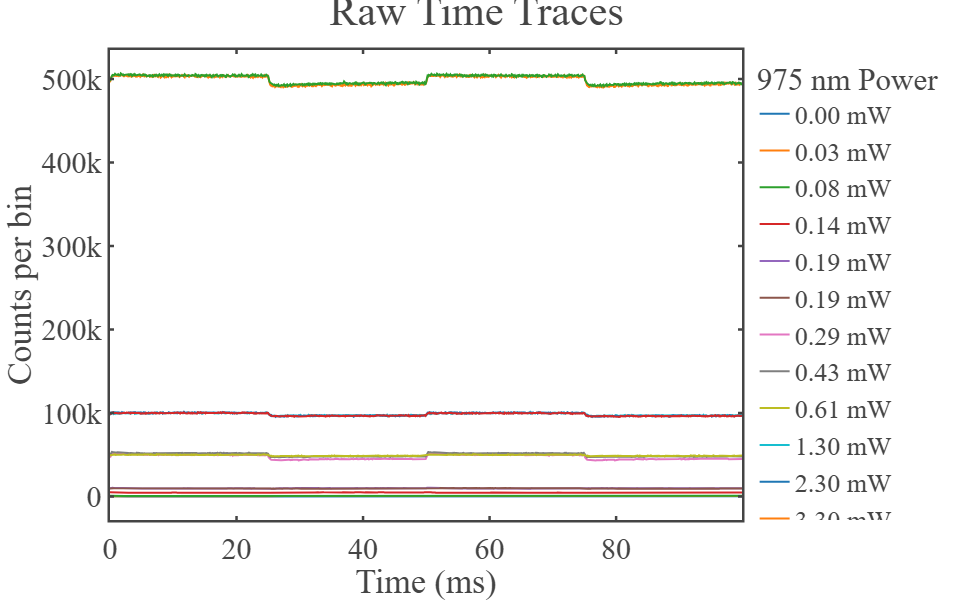

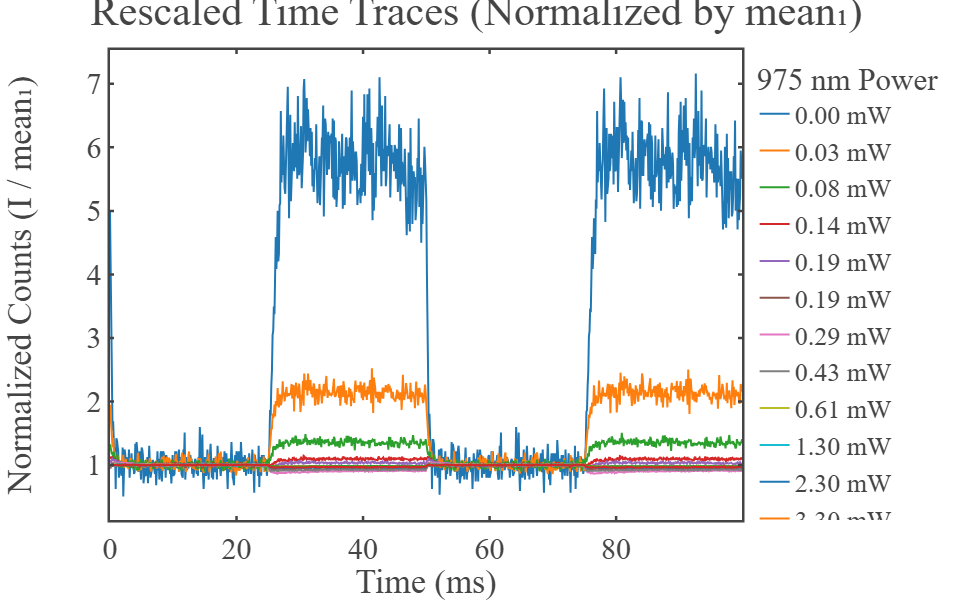

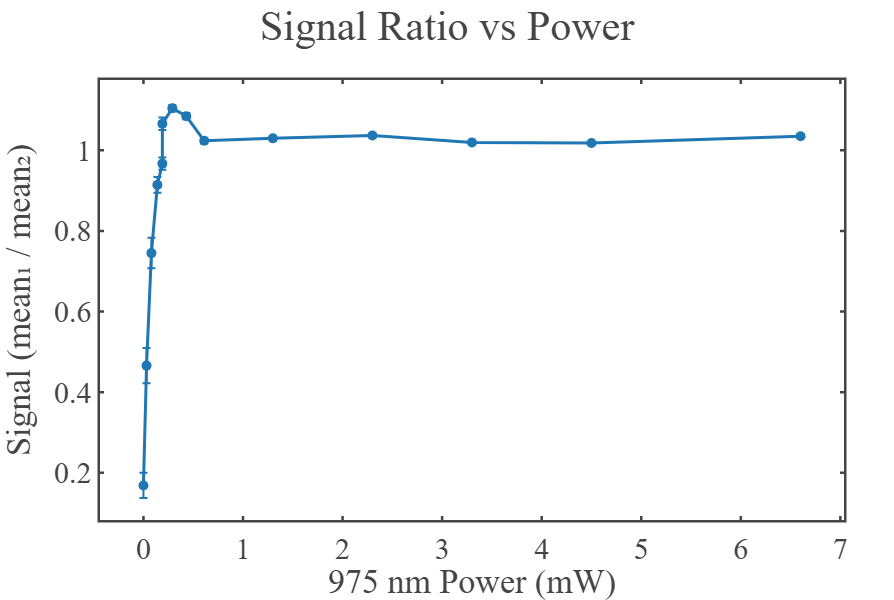

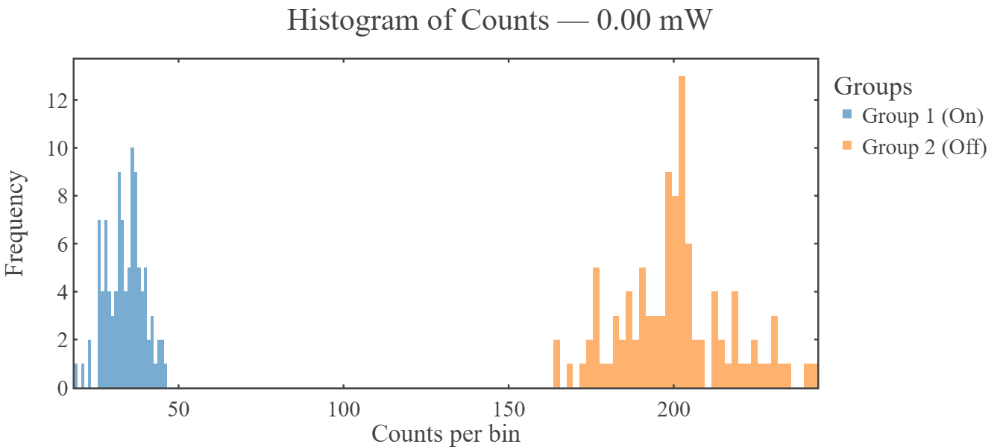

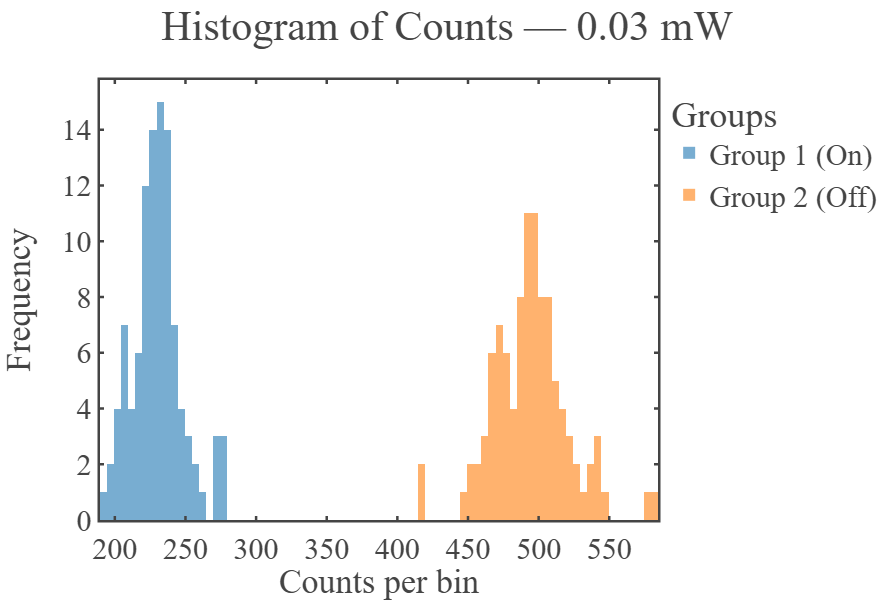

...

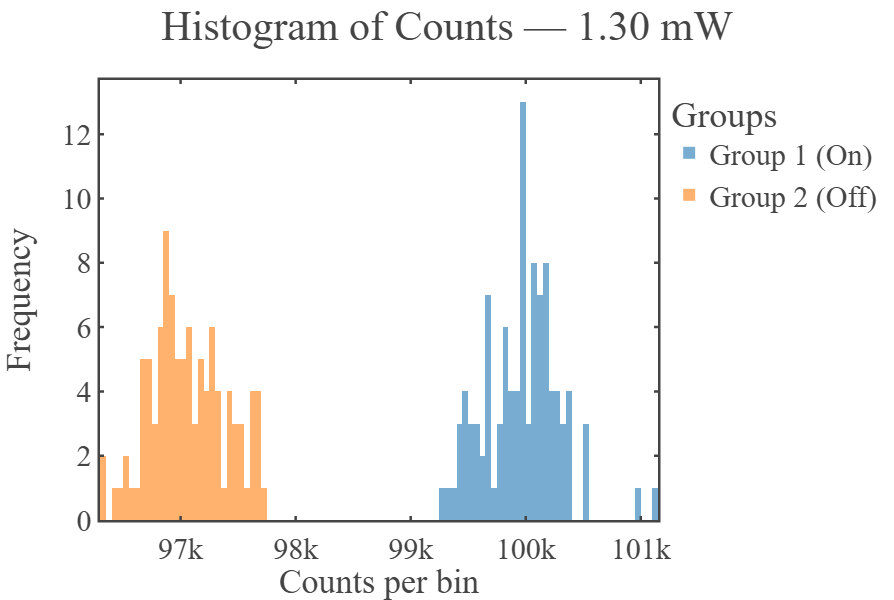

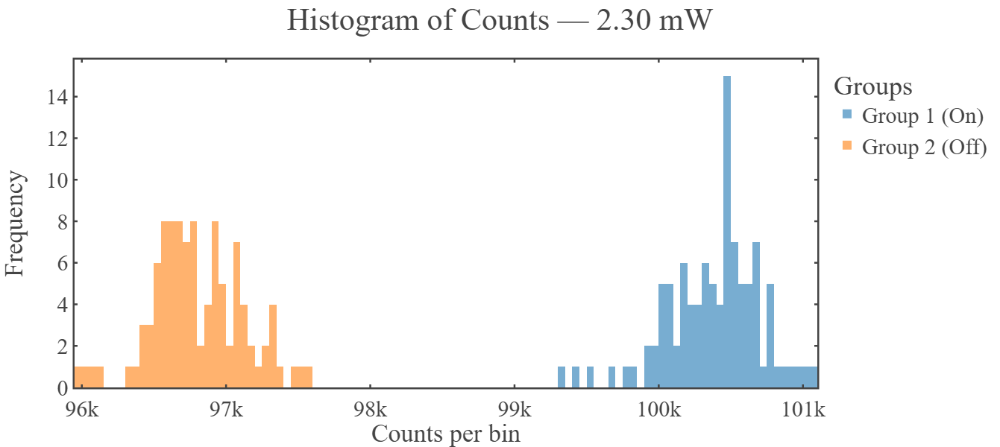

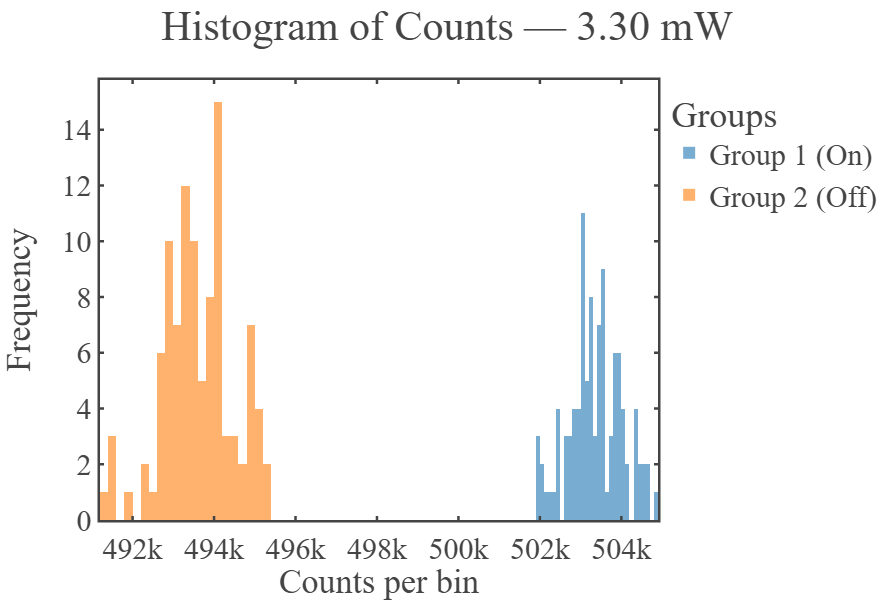

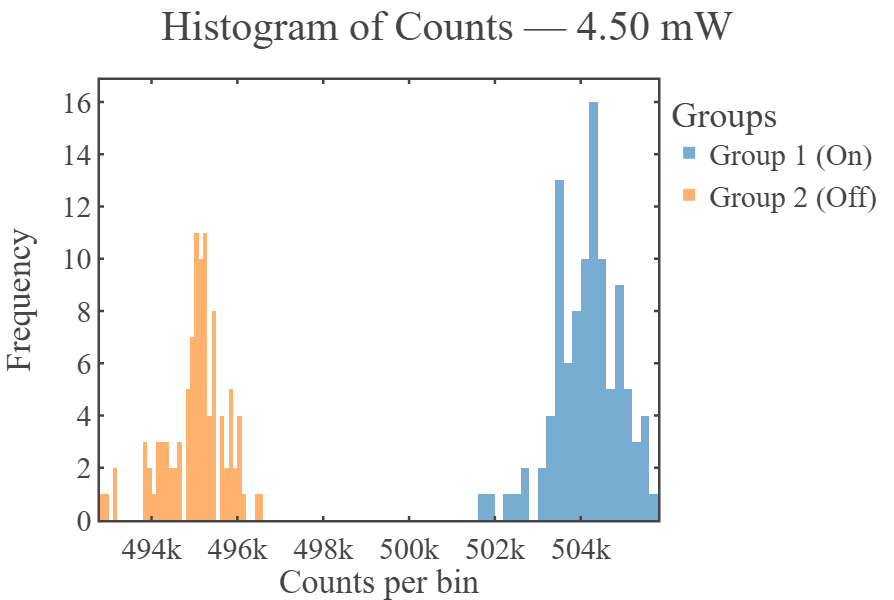

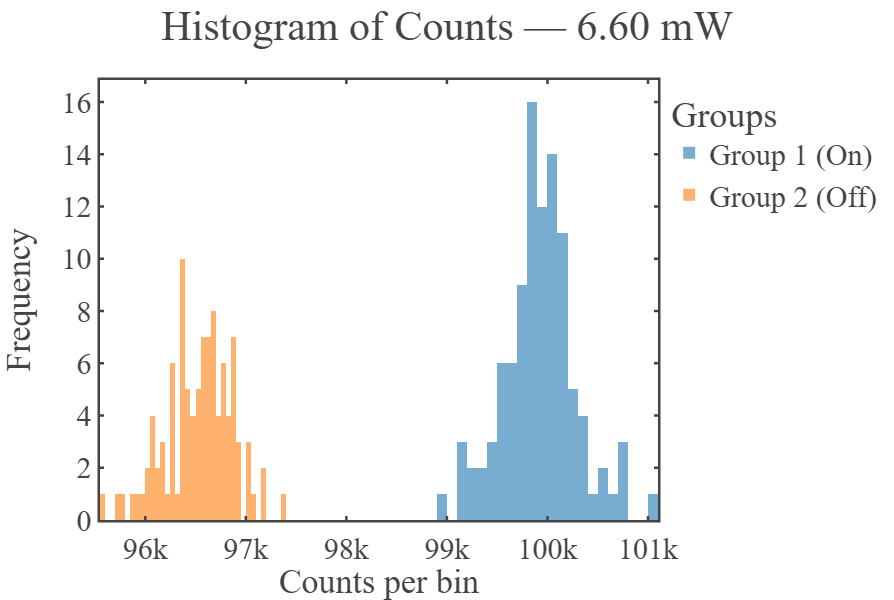

,Power (mW),Mean1,Mean2,Std1,Std2,Signal,Signal_std
0,0.000,33.784314,200.411765,5.598717,16.483713,0.168575,0.031188
1,0.031,230.313725,494.333333,17.605692,26.711360,0.465908,0.043615
2,0.080,735.460784,987.107843,30.968571,27.960724,0.745066,0.037811
3,0.140,4561.186275,4988.274510,68.169876,77.770043,0.914382,0.019748
4,0.190,9663.323529,9991.529412,111.802361,103.788596,0.967152,0.015038
5,0.190,10033.735294,9412.500000,95.714335,102.360929,1.066001,0.015421
6,0.290,49742.372549,45035.049020,229.491378,261.361345,1.104526,0.008189
7,0.430,51975.117647,47908.088235,266.312189,224.751240,1.084892,0.007537
8,0.610,49979.833333,48823.382353,206.637367,251.309942,1.023686,0.006759
9,1.300,99962.588235,97065.460784,324.163096,331.022974,1.029847,0.004846


In [25]:
import os
import re
import numpy as np
import pandas as pd
import plotly.graph_objects as go

# ============================================================
# 1️⃣ --- Folder path ---
# ============================================================
folder_path = r"C:\Users\Atanu\OneDrive\Desktop\research_work\paper\NaBiF4_PL_analysis\datas\6th Oct NaBiF4\1064nm_3.86mW_same_polarization\partial side on"

# ============================================================
# 2️⃣ --- Power calibration mapping (source → sample plane mW) ---
# ============================================================
calibration_dict = {
    0:0, 1:0.031, 2:0.08, 3:0.14, 4:0.19, 5:0.29, 6:0.39, 7:0.43, 8:0.47, 9:0.61,
    10:0.61, 20:1.3, 30:2.3, 50:3.3, 70:4.5, 90:6.6, 110:9.4, 130:10.1,
    150:12.5, 170:14.3, 190:16.1, 210:18.7, 230:21.3, 250:22.3, 270:25.7, 300:22.34
}

# ============================================================
# 3️⃣ --- Custom Plotly template ---
# ============================================================
fig_template = go.layout.Template()
fig_template.layout = {
    'template': 'simple_white+presentation',
    'autosize': False,
    'width': 800,
    'height': 600,
    'xaxis': {'ticks':'inside','mirror':'ticks','linewidth':2.5,'tickwidth':2.5,
              'ticklen':4,'showline':True,'showgrid':False,'zerolinecolor':'white',
              'titlefont':dict(size=34),'tickfont':dict(size=30)},
    'yaxis': {'ticks':'inside','mirror':'ticks','linewidth':2.5,'tickwidth':2.5,
              'ticklen':4,'showline':True,'showgrid':False,'zerolinecolor':'white',
              'titlefont':dict(size=34),'tickfont':dict(size=30)},
    'font': {'family': 'mathjax', 'size': 30}
}

# ============================================================
# 4️⃣ --- Helper: extract calibrated 975 nm power from filename ---
# ============================================================
def extract_calibrated_power(filename):
    match = re.search(r'975nm_(\d+(?:\.\d+)?)mW', filename)
    if match:
        src_power = float(match.group(1))
        nearest_key = min(calibration_dict.keys(), key=lambda k: abs(k - src_power))
        return calibration_dict[nearest_key]
    return None

# ============================================================
# 5️⃣ --- Gather and sort files by calibrated power ---
# ============================================================
file_data = []
for file_name in os.listdir(folder_path):
    if file_name.endswith(('.txt', '.csv')):
        cal_power = extract_calibrated_power(file_name)
        if cal_power is not None:
            file_data.append((file_name, cal_power))
file_data.sort(key=lambda x: x[1])

# ============================================================
# 6️⃣ --- Plot all traces (raw + rescaled) and store group data ---
# ============================================================
groups = [(15,20), (40,45), (65,70), (90,95)]
results = []
histogram_data = {}  # Store group1/group2 arrays per power

# --- (a) Unscaled traces ---
fig_raw = go.Figure()

# --- (b) Rescaled traces ---
fig_rescaled = go.Figure()

for file_name, cal_power in file_data:
    file_path = os.path.join(folder_path, file_name)
    data = pd.read_csv(file_path, sep=None, engine='python')

    if "Time (ps)" in data.columns:
        data["Time (ms)"] = data["Time (ps)"] * 1e-9
    elif "Time (ms)" not in data.columns:
        continue

    # Extract groups
    y_groups = []
    for tmin, tmax in groups:
        mask = (data["Time (ms)"] >= tmin) & (data["Time (ms)"] <= tmax)
        y_groups.append(data.loc[mask, "Counts per bin"].values)

    if any(len(y)==0 for y in y_groups):
        continue

    group1 = np.concatenate([y_groups[0], y_groups[2]])
    group2 = np.concatenate([y_groups[1], y_groups[3]])

    histogram_data[cal_power] = (group1, group2)

    mean1, std1 = np.mean(group1), np.std(group1)
    mean2, std2 = np.mean(group2), np.std(group2)

    signal = mean1 / mean2 if mean2 != 0 else np.nan
    signal_std = signal * np.sqrt((std1/mean1)**2 + (std2/mean2)**2) if mean1>0 and mean2>0 else np.nan
    results.append((cal_power, mean1, mean2, std1, std2, signal, signal_std))

    # --- (a) Raw trace ---
    fig_raw.add_trace(go.Scatter(
        x=data["Time (ms)"],
        y=data["Counts per bin"],
        mode='lines',
        name=f"{cal_power:.2f} mW"
    ))

    # --- (b) Rescaled trace (normalized by mean1) ---
    if mean1 != 0:
        scaled_y = data["Counts per bin"] / mean1
        fig_rescaled.add_trace(go.Scatter(
            x=data["Time (ms)"],
            y=scaled_y,
            mode='lines',
            name=f"{cal_power:.2f} mW"
        ))

# ============================================================
# 7️⃣ --- Layout updates for both plots ---
# ============================================================
fig_raw.update_layout(
    template=fig_template,
    xaxis_title="Time (ms)",
    yaxis_title="Counts per bin",
    legend_title="975 nm Power",
    legend=dict(font=dict(size=26)),
    width=900,
    height=600,
    margin=dict(l=110, r=50, t=50, b=80),
    title="Raw Time Traces"
)

fig_rescaled.update_layout(
    template=fig_template,
    xaxis_title="Time (ms)",
    yaxis_title="Normalized Counts (I / mean₁)",
    legend_title="975 nm Power",
    legend=dict(font=dict(size=26)),
    width=900,
    height=600,
    margin=dict(l=110, r=50, t=50, b=80),
    title="Rescaled Time Traces (Normalized by mean₁)"
)

fig_raw.show()
fig_rescaled.show()

# ============================================================
# 8️⃣ --- DataFrame + Signal vs Power plot ---
# ============================================================
results_df = pd.DataFrame(results, columns=["Power (mW)", "Mean1", "Mean2", "Std1", "Std2", "Signal", "Signal_std"])

fig_signal = go.Figure()
fig_signal.add_trace(go.Scatter(
    x=results_df["Power (mW)"],
    y=results_df["Signal"],
    error_y=dict(type='data', array=results_df["Signal_std"], visible=True),
    mode='markers+lines',
    marker=dict(size=10),
    line=dict(width=3),
    name="Signal Ratio"
))

fig_signal.update_layout(
    template=fig_template,
    xaxis_title="975 nm Power (mW)",
    yaxis_title="Signal (mean₁ / mean₂)",
    legend_title="Data",
    width=900,
    height=600,
    margin=dict(l=100, r=50, t=80, b=80),
    title="Signal Ratio vs Power"
)
fig_signal.show()

# ============================================================
# 9️⃣ --- Histograms for each power ---
# ============================================================
for cal_power, (group1, group2) in histogram_data.items():
    fig_hist = go.Figure()

    fig_hist.add_trace(go.Histogram(
        x=group1,
        name="Group 1 (On)",
        opacity=0.6,
        nbinsx=40
    ))

    fig_hist.add_trace(go.Histogram(
        x=group2,
        name="Group 2 (Off)",
        opacity=0.6,
        nbinsx=40
    ))

    fig_hist.update_layout(
        template=fig_template,
        barmode='overlay',
        xaxis_title="Counts per bin",
        yaxis_title="Frequency",
        legend_title="Groups",
        title=f"Histogram of Counts — {cal_power:.2f} mW",
        width=900,
        height=600,
        margin=dict(l=100, r=50, t=80, b=80)
    )

    fig_hist.show()

results_df

#### with 975nm fixed and varied 1064nm 

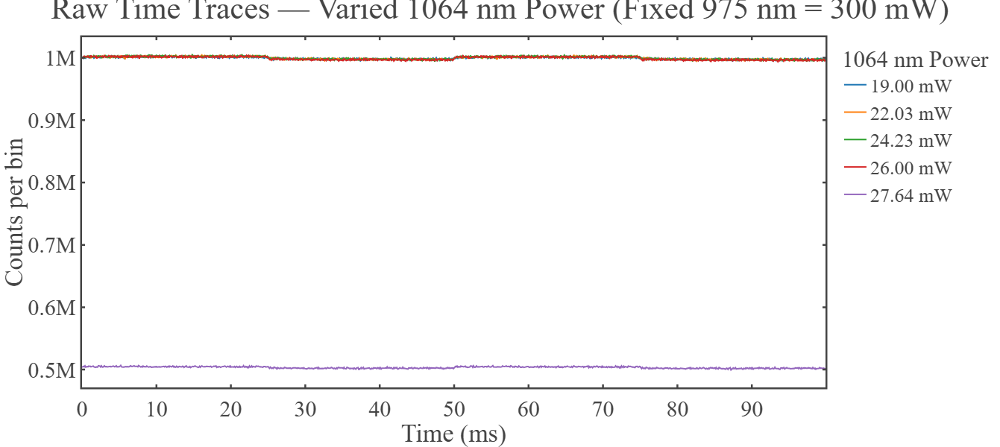

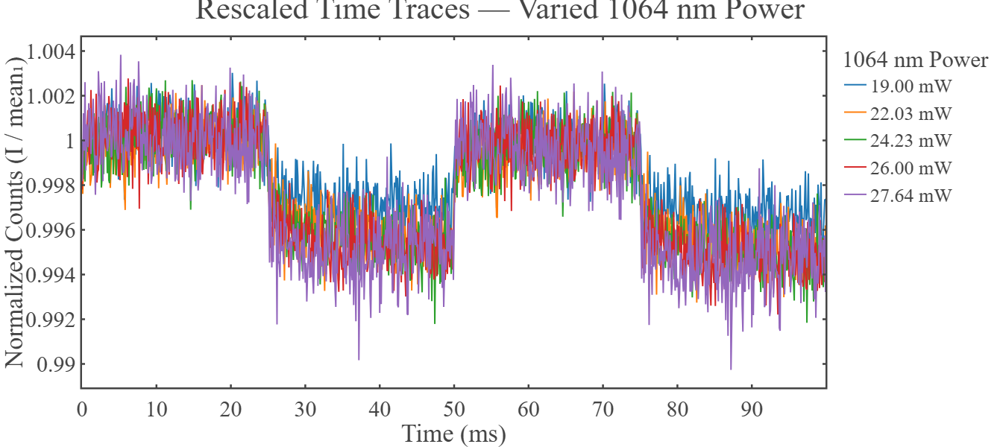

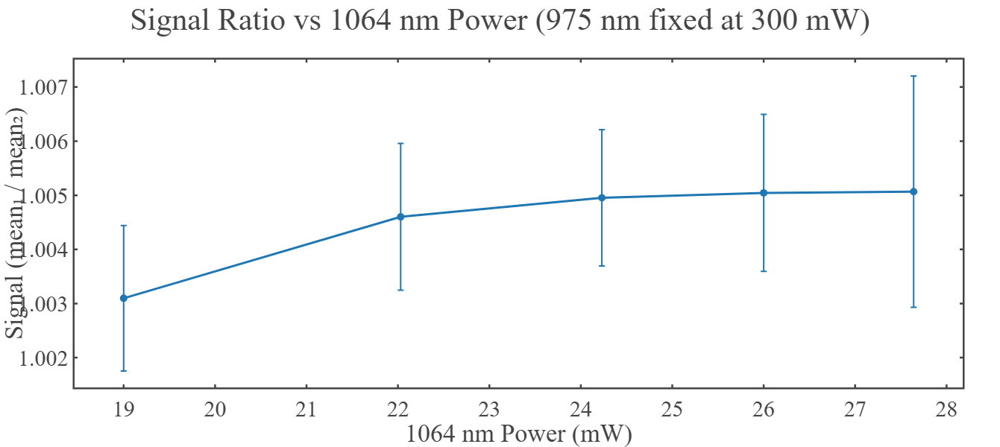

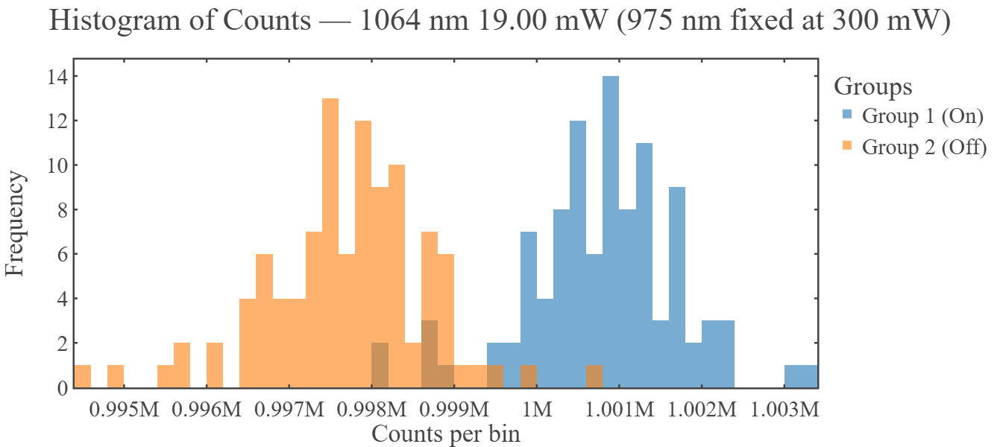

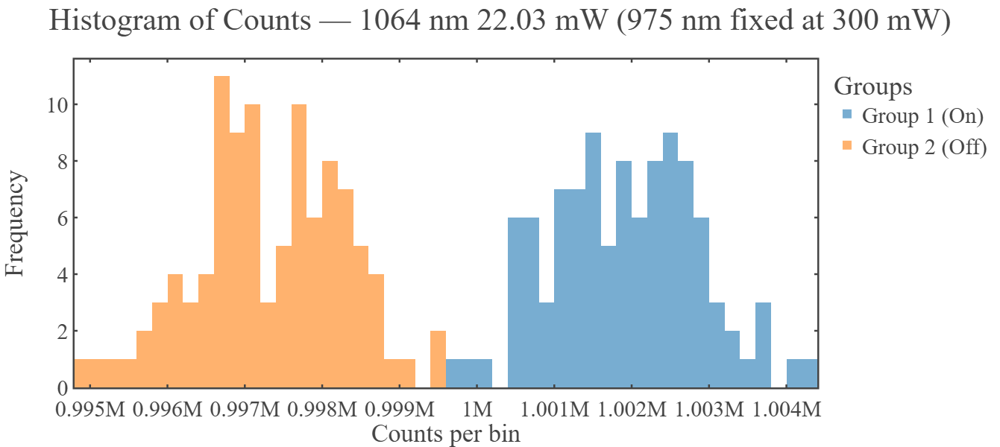

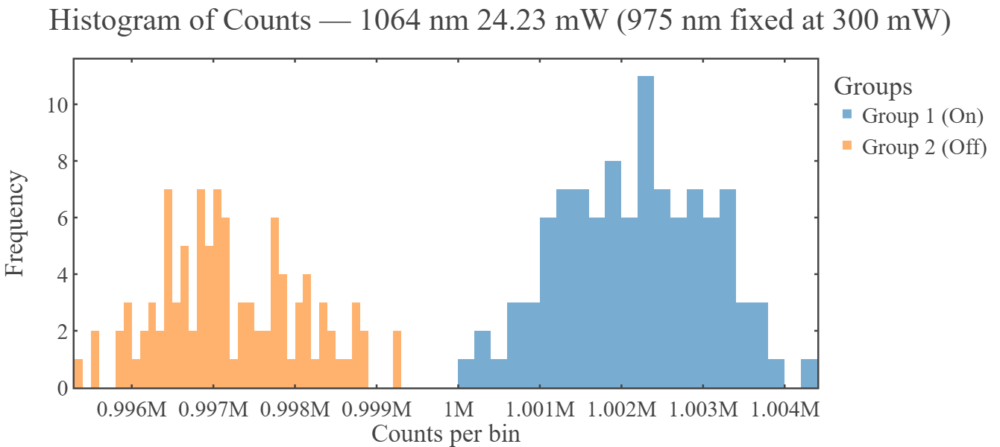

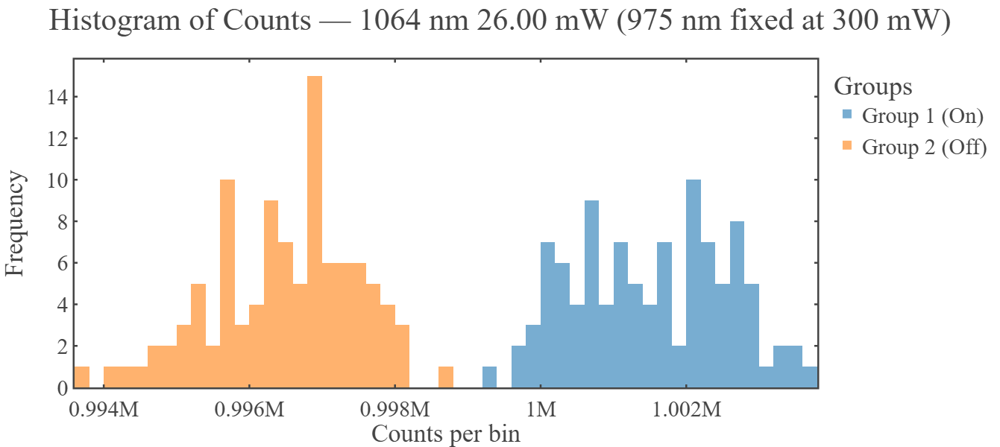

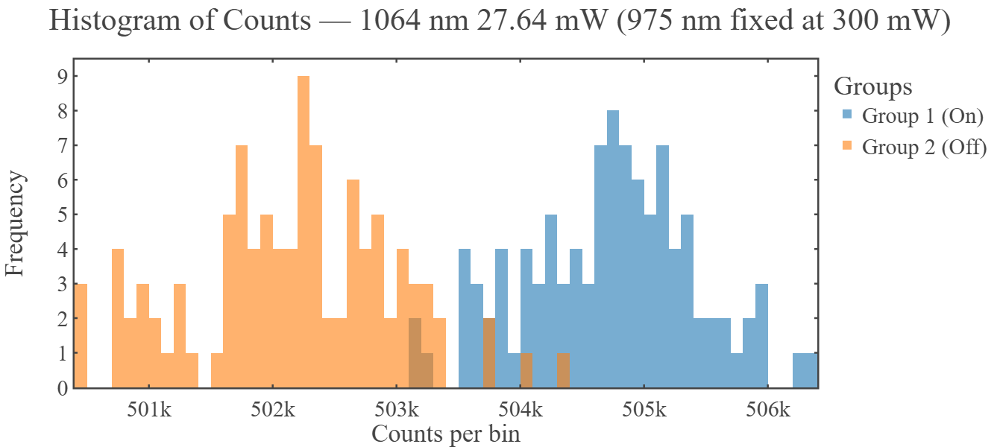

,1064 nm Power (mW),Mean1,Mean2,Std1,Std2,Signal,Signal_std
0,19.00,1.000794e+06,997703.656863,919.321738,973.495244,1.003098,0.001344
1,22.03,1.001903e+06,997313.764706,953.390014,954.497057,1.004602,0.001356
2,24.23,1.002160e+06,997219.254902,895.791490,876.609519,1.004954,0.001260
3,26.00,1.001527e+06,996499.745098,1052.241548,986.807019,1.005045,0.001451
4,27.64,5.047096e+05,502164.607843,692.544851,815.171787,1.005068,0.002136


In [9]:
import os
import re
import numpy as np
import pandas as pd
import plotly.graph_objects as go

# ============================================================
# 1️⃣ --- Folder path ---
# ============================================================
folder_path = r"C:\Users\Atanu\OneDrive\Desktop\research_work\paper\NaBiF4_PL_analysis\datas\3rd oct NaBiF4\same polarization\good Datas"

# ============================================================
# 2️⃣ --- Power calibration mapping (source → sample-plane 1064 nm power, mW) ---
# ============================================================
calibration_dict = {
    3.00: 19.00,
    3.25: 22.03,
    3.50: 24.23,
    3.75: 26.00,
    3.85: 27.64
}

# ============================================================
# 3️⃣ --- Custom Plotly template ---
# ============================================================
fig_template = go.layout.Template()
fig_template.layout = {
    'template': 'simple_white+presentation',
    'autosize': False,
    'width': 800,
    'height': 600,
    'xaxis': {'ticks':'inside','mirror':'ticks','linewidth':2.5,'tickwidth':2.5,
              'ticklen':4,'showline':True,'showgrid':False,'zerolinecolor':'white',
              'titlefont':dict(size=34),'tickfont':dict(size=30)},
    'yaxis': {'ticks':'inside','mirror':'ticks','linewidth':2.5,'tickwidth':2.5,
              'ticklen':4,'showline':True,'showgrid':False,'zerolinecolor':'white',
              'titlefont':dict(size=34),'tickfont':dict(size=30)},
    'font': {'family': 'mathjax', 'size': 30}
}

# ============================================================
# 4️⃣ --- Helper: extract calibrated 1064 nm power from filename ---
# ============================================================
def extract_calibrated_power(filename):
    match = re.search(r'1064nm_(\d+(?:\.\d+)?)mA', filename)
    if match:
        src_power = float(match.group(1))
        nearest_key = min(calibration_dict.keys(), key=lambda k: abs(k - src_power))
        return calibration_dict[nearest_key]
    return None

# ============================================================
# 5️⃣ --- Gather and sort files by calibrated 1064 nm power ---
# ============================================================
file_data = []
for file_name in os.listdir(folder_path):
    if file_name.endswith(('.txt', '.csv')):
        cal_power = extract_calibrated_power(file_name)
        if cal_power is not None:
            file_data.append((file_name, cal_power))
file_data.sort(key=lambda x: x[1])

# ============================================================
# 6️⃣ --- Plot all traces (raw + rescaled) and store group data ---
# ============================================================
groups = [(15,20), (40,45), (65,70), (90,95)]
results = []
histogram_data = {}

fig_raw = go.Figure()
fig_rescaled = go.Figure()

for file_name, cal_power in file_data:
    file_path = os.path.join(folder_path, file_name)
    data = pd.read_csv(file_path, sep=None, engine='python')

    if "Time (ps)" in data.columns:
        data["Time (ms)"] = data["Time (ps)"] * 1e-9
    elif "Time (ms)" not in data.columns:
        continue

    y_groups = []
    for tmin, tmax in groups:
        mask = (data["Time (ms)"] >= tmin) & (data["Time (ms)"] <= tmax)
        y_groups.append(data.loc[mask, "Counts per bin"].values)

    if any(len(y)==0 for y in y_groups):
        continue

    group1 = np.concatenate([y_groups[0], y_groups[2]])
    group2 = np.concatenate([y_groups[1], y_groups[3]])

    histogram_data[cal_power] = (group1, group2)

    mean1, std1 = np.mean(group1), np.std(group1)
    mean2, std2 = np.mean(group2), np.std(group2)

    signal = mean1 / mean2 if mean2 != 0 else np.nan
    signal_std = signal * np.sqrt((std1/mean1)**2 + (std2/mean2)**2) if mean1>0 and mean2>0 else np.nan
    results.append((cal_power, mean1, mean2, std1, std2, signal, signal_std))

    # --- (a) Raw trace ---
    fig_raw.add_trace(go.Scatter(
        x=data["Time (ms)"],
        y=data["Counts per bin"],
        mode='lines',
        name=f"{cal_power:.2f} mW"
    ))

    # --- (b) Rescaled trace (normalized by mean1) ---
    if mean1 != 0:
        scaled_y = data["Counts per bin"] / mean1
        fig_rescaled.add_trace(go.Scatter(
            x=data["Time (ms)"],
            y=scaled_y,
            mode='lines',
            name=f"{cal_power:.2f} mW"
        ))

# ============================================================
# 7️⃣ --- Layout updates for both plots ---
# ============================================================
fig_raw.update_layout(
    template=fig_template,
    xaxis_title="Time (ms)",
    yaxis_title="Counts per bin",
    legend_title="1064 nm Power",
    legend=dict(font=dict(size=26)),
    width=900,
    height=600,
    margin=dict(l=110, r=50, t=50, b=80),
    title="Raw Time Traces — Varied 1064 nm Power (Fixed 975 nm = 300 mW)"
)

fig_rescaled.update_layout(
    template=fig_template,
    xaxis_title="Time (ms)",
    yaxis_title="Normalized Counts (I / mean₁)",
    legend_title="1064 nm Power",
    legend=dict(font=dict(size=26)),
    width=900,
    height=600,
    margin=dict(l=110, r=50, t=50, b=80),
    title="Rescaled Time Traces — Varied 1064 nm Power"
)

fig_raw.show()
fig_rescaled.show()

# ============================================================
# 8️⃣ --- DataFrame + Signal vs 1064 nm Power plot ---
# ============================================================
results_df = pd.DataFrame(results, columns=["1064 nm Power (mW)", "Mean1", "Mean2", "Std1", "Std2", "Signal", "Signal_std"])

fig_signal = go.Figure()
fig_signal.add_trace(go.Scatter(
    x=results_df["1064 nm Power (mW)"],
    y=results_df["Signal"],
    error_y=dict(type='data', array=results_df["Signal_std"], visible=True),
    mode='markers+lines',
    marker=dict(size=10),
    line=dict(width=3),
    name="Signal Ratio"
))

fig_signal.update_layout(
    template=fig_template,
    xaxis_title="1064 nm Power (mW)",
    yaxis_title="Signal (mean₁ / mean₂)",
    legend_title="Data",
    width=900,
    height=600,
    margin=dict(l=100, r=50, t=80, b=80),
    title="Signal Ratio vs 1064 nm Power (975 nm fixed at 300 mW)"
)
fig_signal.show()

# ============================================================
# 9️⃣ --- Histograms for each 1064 nm power ---
# ============================================================
for cal_power, (group1, group2) in histogram_data.items():
    fig_hist = go.Figure()

    fig_hist.add_trace(go.Histogram(
        x=group1,
        name="Group 1 (On)",
        opacity=0.6,
        nbinsx=40
    ))

    fig_hist.add_trace(go.Histogram(
        x=group2,
        name="Group 2 (Off)",
        opacity=0.6,
        nbinsx=40
    ))

    fig_hist.update_layout(
        template=fig_template,
        barmode='overlay',
        xaxis_title="Counts per bin",
        yaxis_title="Frequency",
        legend_title="Groups",
        title=f"Histogram of Counts — 1064 nm {cal_power:.2f} mW (975 nm fixed at 300 mW)",
        width=900,
        height=600,
        margin=dict(l=100, r=50, t=80, b=80)
    )

    fig_hist.show()

results_df


### Perpendicular Polarization

#### side on

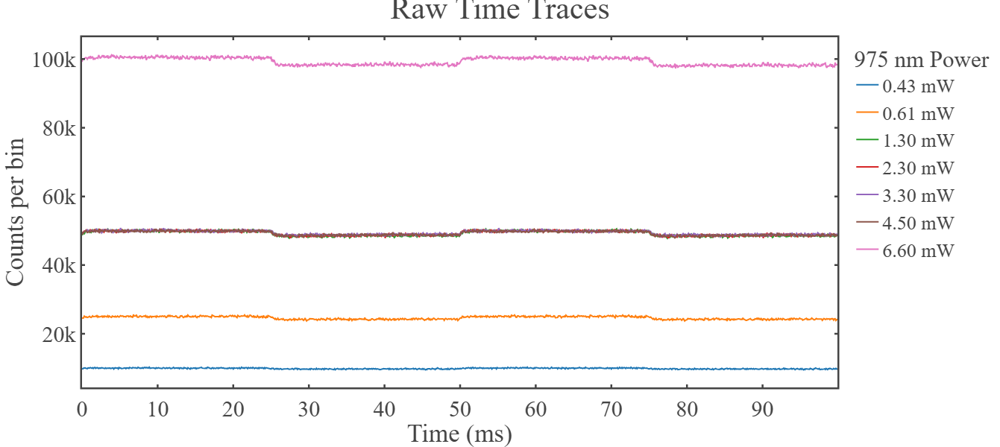

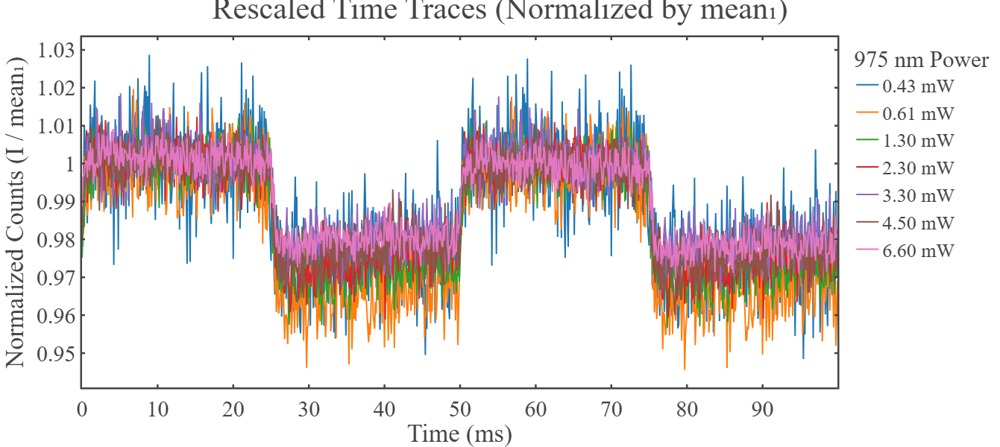

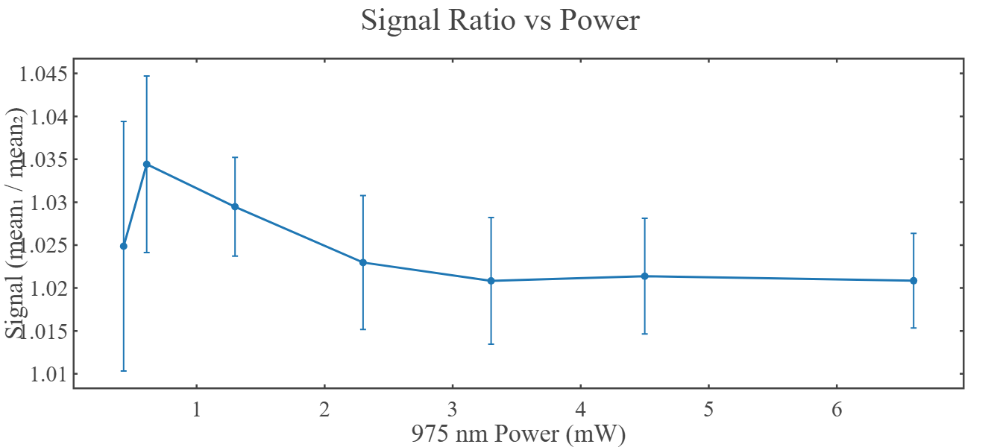

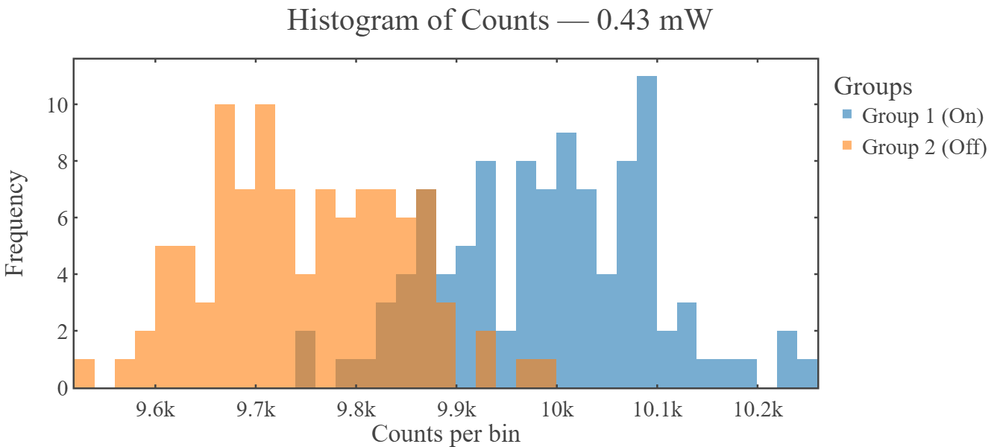

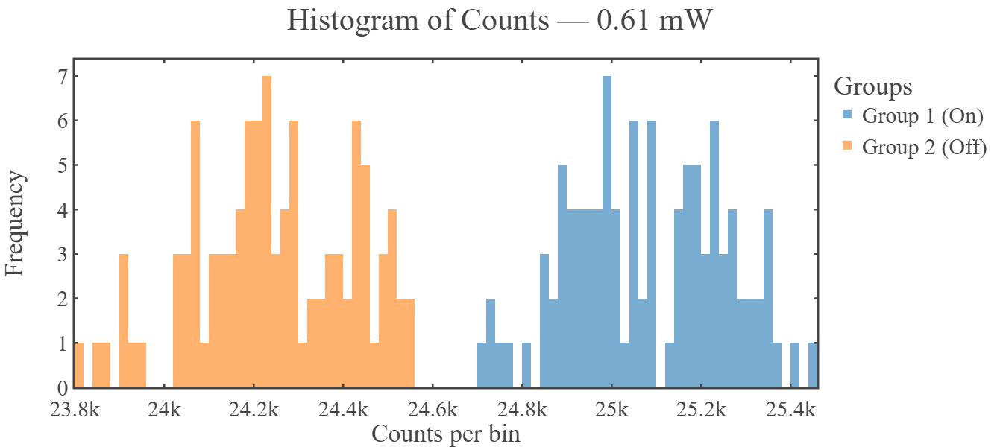

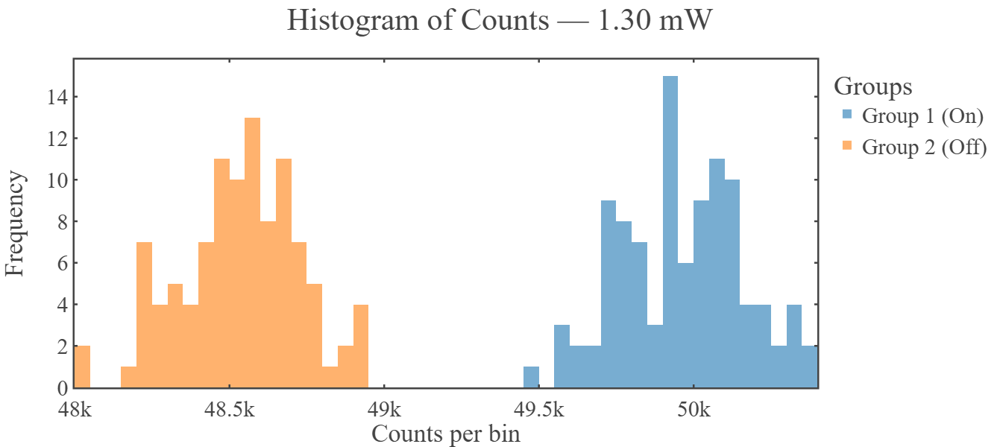

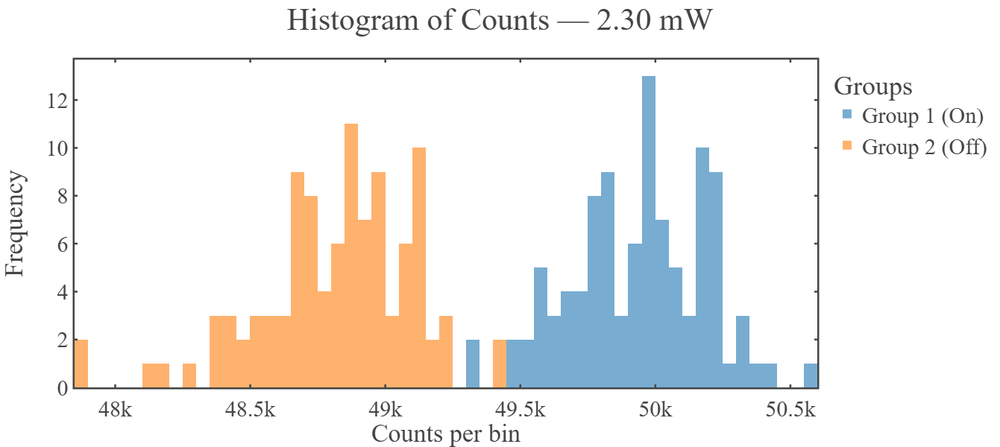

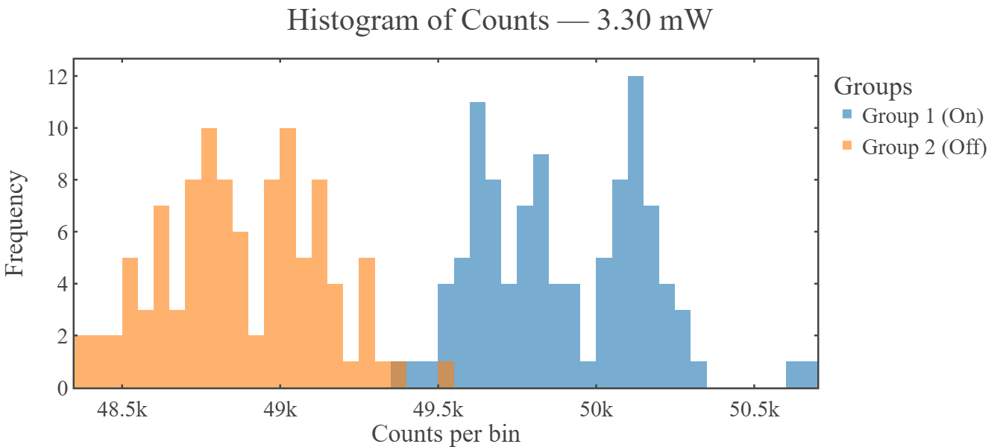

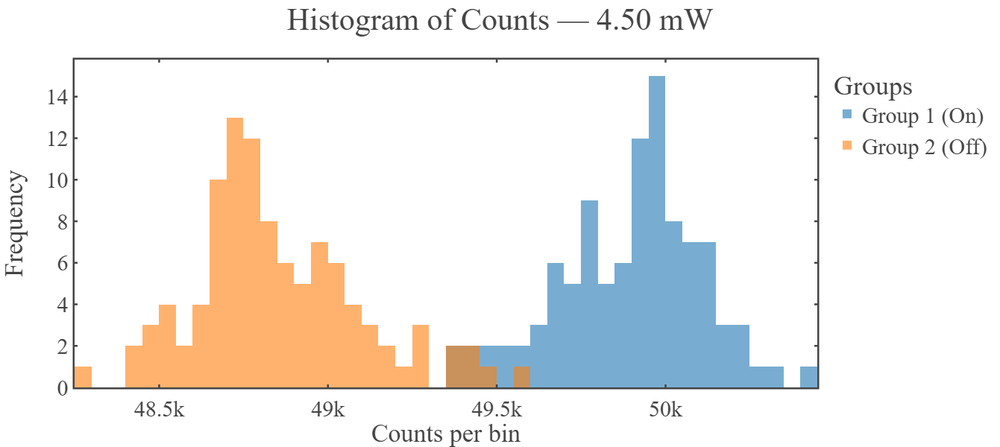

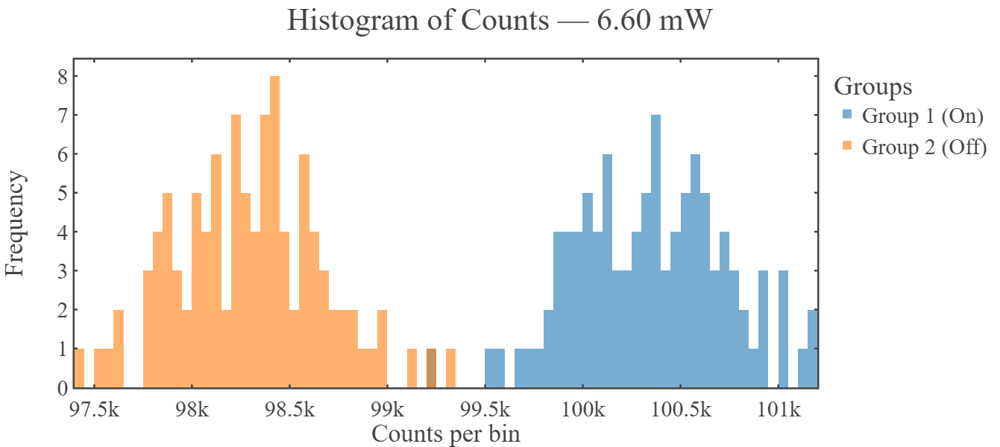

,Power (mW),Mean1,Mean2,Std1,Std2,Signal,Signal_std
0,0.43,9991.264706,9748.882353,104.390944,93.553832,1.024863,0.014539
1,0.61,25079.794118,24245.274510,170.924897,175.584244,1.034420,0.010287
2,1.30,49963.421569,48533.460784,198.268803,190.890723,1.029463,0.005752
3,2.30,49938.009804,48816.833333,246.700958,283.794011,1.022967,0.007804
4,3.30,49892.725490,48874.460784,260.142463,244.548350,1.020834,0.007377
5,4.50,49894.382353,48850.000000,211.680857,247.017900,1.021379,0.006742
6,6.60,100346.568627,98297.872549,385.200699,373.351059,1.020842,0.005513


In [30]:
import os
import re
import numpy as np
import pandas as pd
import plotly.graph_objects as go

# ============================================================
# 1️⃣ --- Folder path ---
# ============================================================
folder_path = r"C:\Users\Atanu\OneDrive\Desktop\research_work\paper\NaBiF4_PL_analysis\datas\7th Oct NaBiF4\side on"

# ============================================================
# 2️⃣ --- Power calibration mapping (source → sample plane mW) ---
# ============================================================
calibration_dict = {
    0:0, 1:0.031, 2:0.08, 3:0.14, 4:0.19, 5:0.29, 6:0.39, 7:0.43, 8:0.47, 9:0.61,
    10:0.61, 20:1.3, 30:2.3, 50:3.3, 70:4.5, 90:6.6, 110:9.4, 130:10.1,
    150:12.5, 170:14.3, 190:16.1, 210:18.7, 230:21.3, 250:22.3, 270:25.7, 300:22.34
}

# ============================================================
# 3️⃣ --- Custom Plotly template ---
# ============================================================
fig_template = go.layout.Template()
fig_template.layout = {
    'template': 'simple_white+presentation',
    'autosize': False,
    'width': 800,
    'height': 600,
    'xaxis': {'ticks':'inside','mirror':'ticks','linewidth':2.5,'tickwidth':2.5,
              'ticklen':4,'showline':True,'showgrid':False,'zerolinecolor':'white',
              'titlefont':dict(size=34),'tickfont':dict(size=30)},
    'yaxis': {'ticks':'inside','mirror':'ticks','linewidth':2.5,'tickwidth':2.5,
              'ticklen':4,'showline':True,'showgrid':False,'zerolinecolor':'white',
              'titlefont':dict(size=34),'tickfont':dict(size=30)},
    'font': {'family': 'mathjax', 'size': 30}
}

# ============================================================
# 4️⃣ --- Helper: extract calibrated 975 nm power from filename ---
# ============================================================
def extract_calibrated_power(filename):
    match = re.search(r'975nm_(\d+(?:\.\d+)?)mW', filename)
    if match:
        src_power = float(match.group(1))
        nearest_key = min(calibration_dict.keys(), key=lambda k: abs(k - src_power))
        return calibration_dict[nearest_key]
    return None

# ============================================================
# 5️⃣ --- Gather and sort files by calibrated power ---
# ============================================================
file_data = []
for file_name in os.listdir(folder_path):
    if file_name.endswith(('.txt', '.csv')):
        cal_power = extract_calibrated_power(file_name)
        if cal_power is not None:
            file_data.append((file_name, cal_power))
file_data.sort(key=lambda x: x[1])

# ============================================================
# 6️⃣ --- Plot all traces (raw + rescaled) and store group data ---
# ============================================================
groups = [(15,20), (40,45), (65,70), (90,95)]
results = []
histogram_data = {}  # Store group1/group2 arrays per power

# --- (a) Unscaled traces ---
fig_raw = go.Figure()

# --- (b) Rescaled traces ---
fig_rescaled = go.Figure()

for file_name, cal_power in file_data:
    file_path = os.path.join(folder_path, file_name)
    data = pd.read_csv(file_path, sep=None, engine='python')

    if "Time (ps)" in data.columns:
        data["Time (ms)"] = data["Time (ps)"] * 1e-9
    elif "Time (ms)" not in data.columns:
        continue

    # Extract groups
    y_groups = []
    for tmin, tmax in groups:
        mask = (data["Time (ms)"] >= tmin) & (data["Time (ms)"] <= tmax)
        y_groups.append(data.loc[mask, "Counts per bin"].values)

    if any(len(y)==0 for y in y_groups):
        continue

    group1 = np.concatenate([y_groups[0], y_groups[2]])
    group2 = np.concatenate([y_groups[1], y_groups[3]])

    histogram_data[cal_power] = (group1, group2)

    mean1, std1 = np.mean(group1), np.std(group1)
    mean2, std2 = np.mean(group2), np.std(group2)

    signal = mean1 / mean2 if mean2 != 0 else np.nan
    signal_std = signal * np.sqrt((std1/mean1)**2 + (std2/mean2)**2) if mean1>0 and mean2>0 else np.nan
    results.append((cal_power, mean1, mean2, std1, std2, signal, signal_std))

    # --- (a) Raw trace ---
    fig_raw.add_trace(go.Scatter(
        x=data["Time (ms)"],
        y=data["Counts per bin"],
        mode='lines',
        name=f"{cal_power:.2f} mW"
    ))

    # --- (b) Rescaled trace (normalized by mean1) ---
    if mean1 != 0:
        scaled_y = data["Counts per bin"] / mean1
        fig_rescaled.add_trace(go.Scatter(
            x=data["Time (ms)"],
            y=scaled_y,
            mode='lines',
            name=f"{cal_power:.2f} mW"
        ))

# ============================================================
# 7️⃣ --- Layout updates for both plots ---
# ============================================================
fig_raw.update_layout(
    template=fig_template,
    xaxis_title="Time (ms)",
    yaxis_title="Counts per bin",
    legend_title="975 nm Power",
    legend=dict(font=dict(size=26)),
    width=900,
    height=600,
    margin=dict(l=110, r=50, t=50, b=80),
    title="Raw Time Traces"
)

fig_rescaled.update_layout(
    template=fig_template,
    xaxis_title="Time (ms)",
    yaxis_title="Normalized Counts (I / mean₁)",
    legend_title="975 nm Power",
    legend=dict(font=dict(size=26)),
    width=900,
    height=600,
    margin=dict(l=110, r=50, t=50, b=80),
    title="Rescaled Time Traces (Normalized by mean₁)"
)

fig_raw.show()
fig_rescaled.show()

# ============================================================
# 8️⃣ --- DataFrame + Signal vs Power plot ---
# ============================================================
results_df = pd.DataFrame(results, columns=["Power (mW)", "Mean1", "Mean2", "Std1", "Std2", "Signal", "Signal_std"])

fig_signal = go.Figure()
fig_signal.add_trace(go.Scatter(
    x=results_df["Power (mW)"],
    y=results_df["Signal"],
    error_y=dict(type='data', array=results_df["Signal_std"], visible=True),
    mode='markers+lines',
    marker=dict(size=10),
    line=dict(width=3),
    name="Signal Ratio"
))

fig_signal.update_layout(
    template=fig_template,
    xaxis_title="975 nm Power (mW)",
    yaxis_title="Signal (mean₁ / mean₂)",
    legend_title="Data",
    width=900,
    height=600,
    margin=dict(l=100, r=50, t=80, b=80),
    title="Signal Ratio vs Power"
)
fig_signal.show()

# ============================================================
# 9️⃣ --- Histograms for each power ---
# ============================================================
for cal_power, (group1, group2) in histogram_data.items():
    fig_hist = go.Figure()

    fig_hist.add_trace(go.Histogram(
        x=group1,
        name="Group 1 (On)",
        opacity=0.6,
        nbinsx=40
    ))

    fig_hist.add_trace(go.Histogram(
        x=group2,
        name="Group 2 (Off)",
        opacity=0.6,
        nbinsx=40
    ))

    fig_hist.update_layout(
        template=fig_template,
        barmode='overlay',
        xaxis_title="Counts per bin",
        yaxis_title="Frequency",
        legend_title="Groups",
        title=f"Histogram of Counts — {cal_power:.2f} mW",
        width=900,
        height=600,
        margin=dict(l=100, r=50, t=80, b=80)
    )

    fig_hist.show()

results_df


#### face on

##### 1064nm 3.85mA

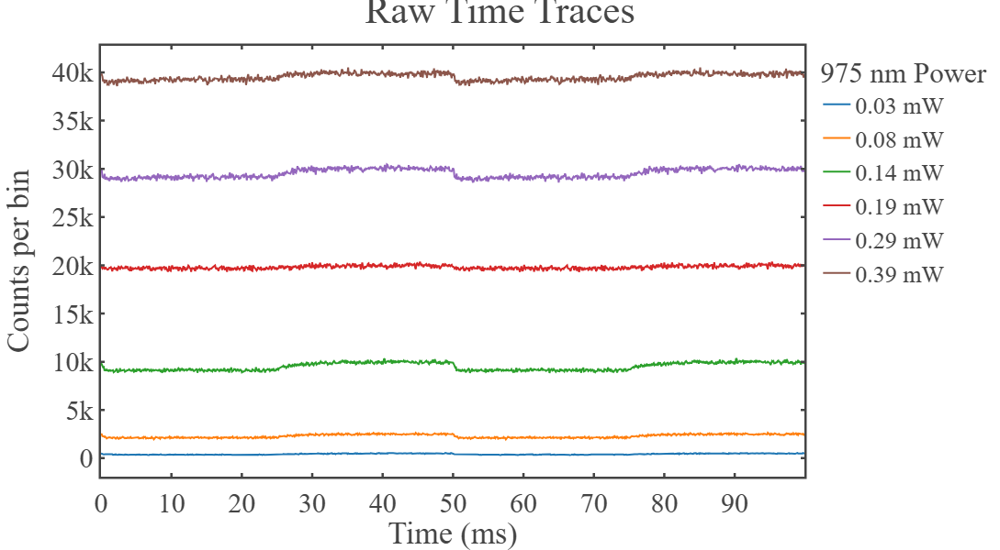

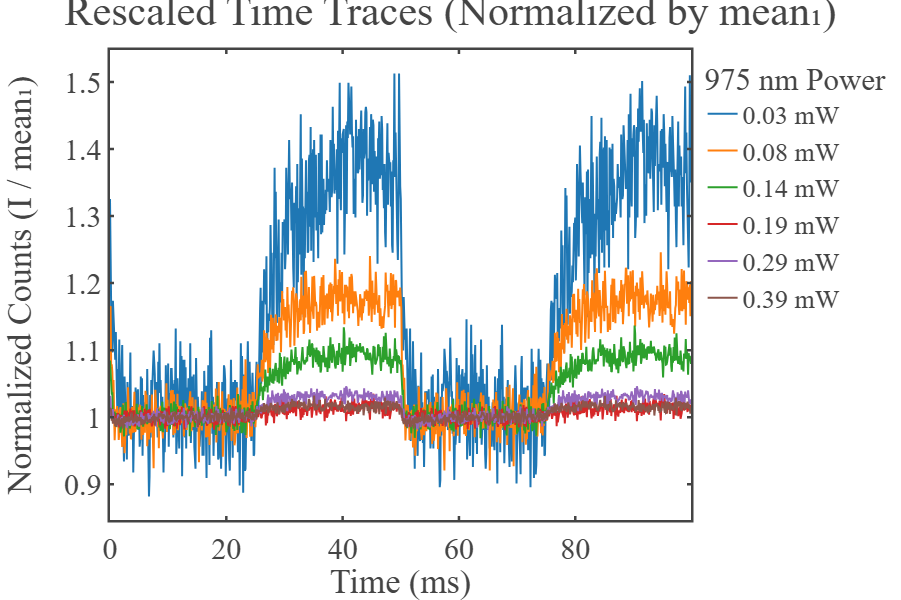

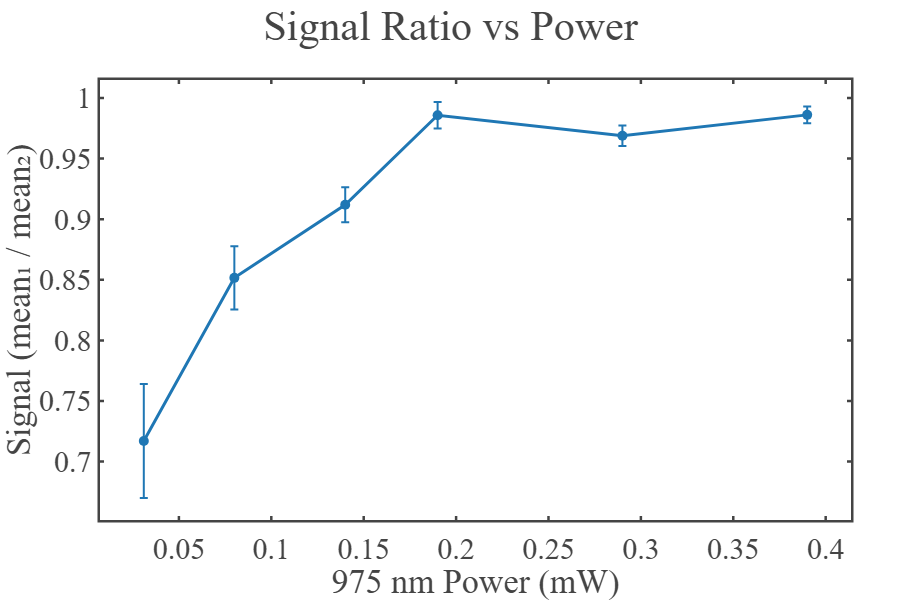

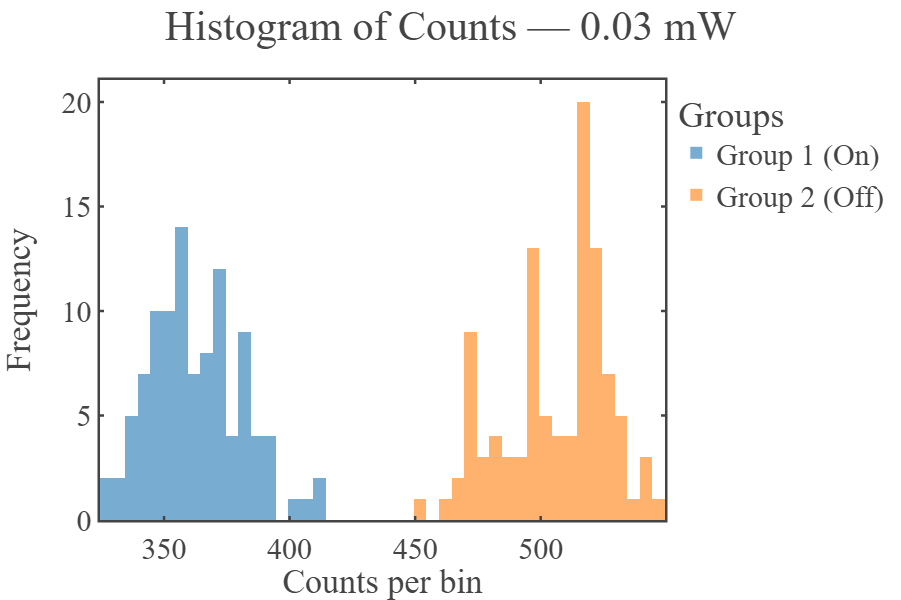

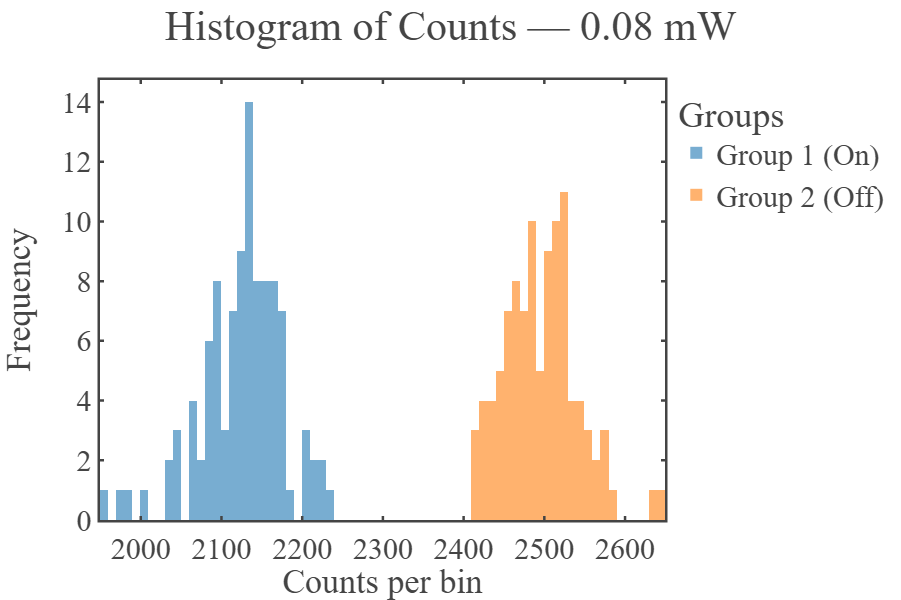

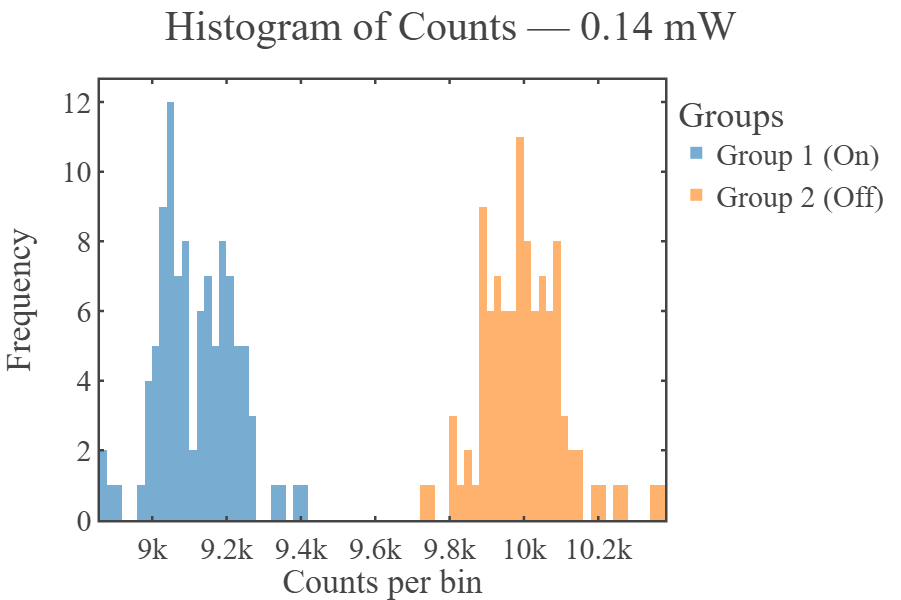

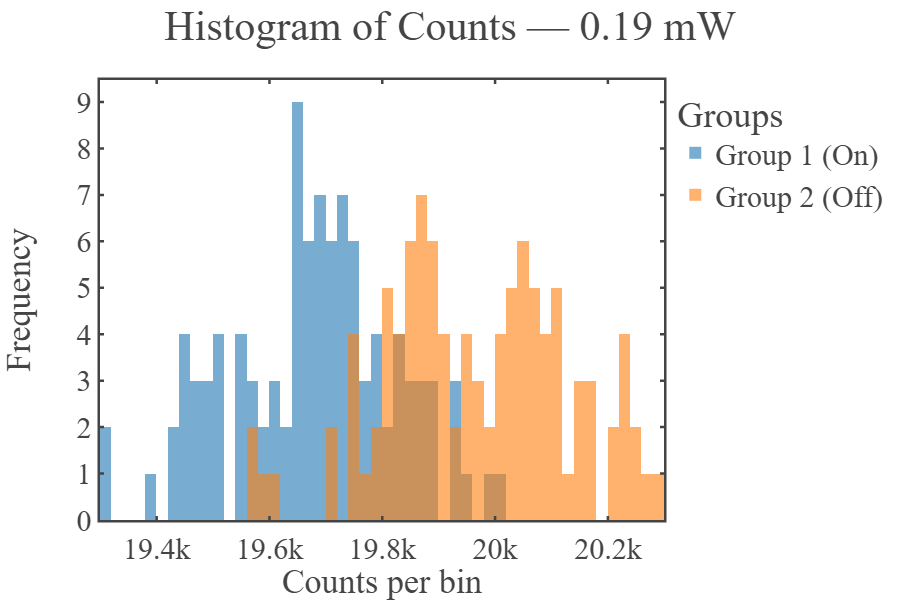

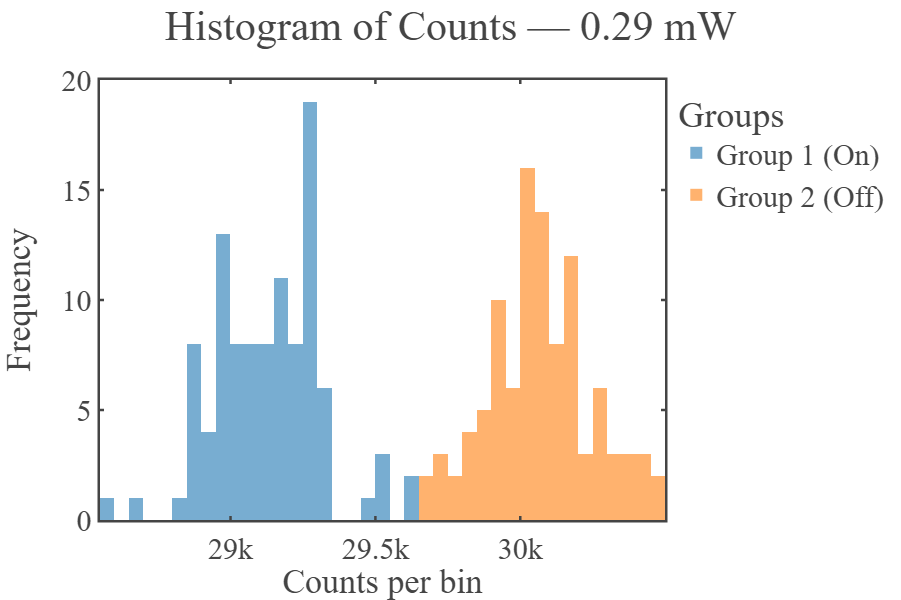

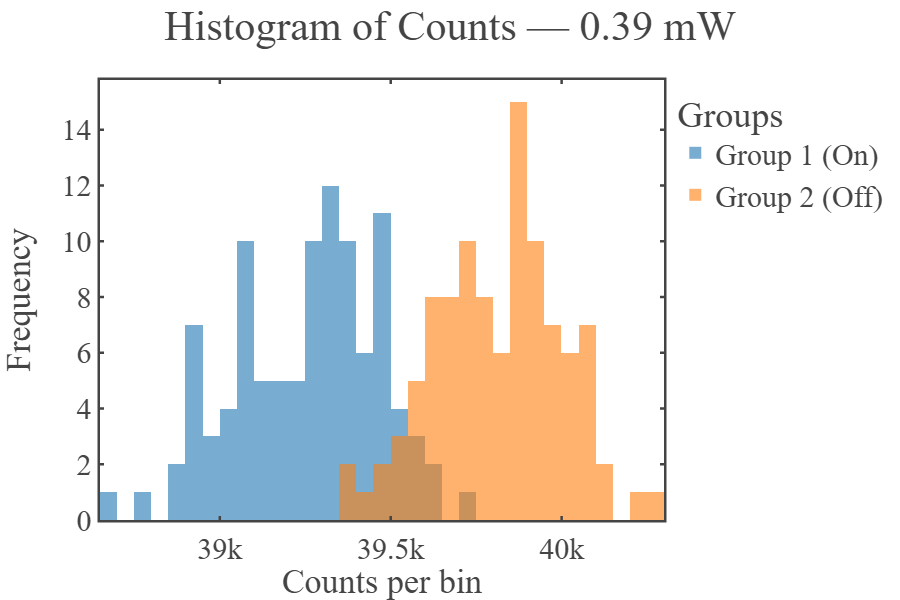

,Power (mW),Mean1,Mean2,Std1,Std2,Signal,Signal_std
0,0.031,362.931373,506.205882,18.427526,20.974933,0.716964,0.046987
1,0.080,2125.127451,2495.549020,52.173668,45.623486,0.851567,0.026066
2,0.140,9118.892157,9999.774510,104.515681,109.836769,0.911910,0.014476
3,0.190,19679.558824,19964.950980,148.439304,162.595214,0.985705,0.010942
4,0.290,29129.156863,30069.205882,186.431018,177.788999,0.968737,0.008441
5,0.390,39255.627451,39811.656863,210.382701,184.559119,0.986034,0.006987


In [26]:
import os
import re
import numpy as np
import pandas as pd
import plotly.graph_objects as go

# ============================================================
# 1️⃣ --- Folder path ---
# ============================================================
folder_path = r"C:\Users\Atanu\OneDrive\Desktop\research_work\paper\NaBiF4_PL_analysis\datas\7th Oct NaBiF4\face on\good datas\1064nm_3.65mA"

# ============================================================
# 2️⃣ --- Power calibration mapping (source → sample plane mW) ---
# ============================================================
calibration_dict = {
    0:0, 1:0.031, 2:0.08, 3:0.14, 4:0.19, 5:0.29, 6:0.39, 7:0.43, 8:0.47, 9:0.61,
    10:0.61, 20:1.3, 30:2.3, 50:3.3, 70:4.5, 90:6.6, 110:9.4, 130:10.1,
    150:12.5, 170:14.3, 190:16.1, 210:18.7, 230:21.3, 250:22.3, 270:25.7, 300:22.34
}

# ============================================================
# 3️⃣ --- Custom Plotly template ---
# ============================================================
fig_template = go.layout.Template()
fig_template.layout = {
    'template': 'simple_white+presentation',
    'autosize': False,
    'width': 800,
    'height': 600,
    'xaxis': {'ticks':'inside','mirror':'ticks','linewidth':2.5,'tickwidth':2.5,
              'ticklen':4,'showline':True,'showgrid':False,'zerolinecolor':'white',
              'titlefont':dict(size=34),'tickfont':dict(size=30)},
    'yaxis': {'ticks':'inside','mirror':'ticks','linewidth':2.5,'tickwidth':2.5,
              'ticklen':4,'showline':True,'showgrid':False,'zerolinecolor':'white',
              'titlefont':dict(size=34),'tickfont':dict(size=30)},
    'font': {'family': 'mathjax', 'size': 30}
}

# ============================================================
# 4️⃣ --- Helper: extract calibrated 975 nm power from filename ---
# ============================================================
def extract_calibrated_power(filename):
    match = re.search(r'975nm_(\d+(?:\.\d+)?)mW', filename)
    if match:
        src_power = float(match.group(1))
        nearest_key = min(calibration_dict.keys(), key=lambda k: abs(k - src_power))
        return calibration_dict[nearest_key]
    return None

# ============================================================
# 5️⃣ --- Gather and sort files by calibrated power ---
# ============================================================
file_data = []
for file_name in os.listdir(folder_path):
    if file_name.endswith(('.txt', '.csv')):
        cal_power = extract_calibrated_power(file_name)
        if cal_power is not None:
            file_data.append((file_name, cal_power))
file_data.sort(key=lambda x: x[1])

# ============================================================
# 6️⃣ --- Plot all traces (raw + rescaled) and store group data ---
# ============================================================
groups = [(15,20), (40,45), (65,70), (90,95)]
results = []
histogram_data = {}  # Store group1/group2 arrays per power

# --- (a) Unscaled traces ---
fig_raw = go.Figure()

# --- (b) Rescaled traces ---
fig_rescaled = go.Figure()

for file_name, cal_power in file_data:
    file_path = os.path.join(folder_path, file_name)
    data = pd.read_csv(file_path, sep=None, engine='python')

    if "Time (ps)" in data.columns:
        data["Time (ms)"] = data["Time (ps)"] * 1e-9
    elif "Time (ms)" not in data.columns:
        continue

    # Extract groups
    y_groups = []
    for tmin, tmax in groups:
        mask = (data["Time (ms)"] >= tmin) & (data["Time (ms)"] <= tmax)
        y_groups.append(data.loc[mask, "Counts per bin"].values)

    if any(len(y)==0 for y in y_groups):
        continue

    group1 = np.concatenate([y_groups[0], y_groups[2]])
    group2 = np.concatenate([y_groups[1], y_groups[3]])

    histogram_data[cal_power] = (group1, group2)

    mean1, std1 = np.mean(group1), np.std(group1)
    mean2, std2 = np.mean(group2), np.std(group2)

    signal = mean1 / mean2 if mean2 != 0 else np.nan
    signal_std = signal * np.sqrt((std1/mean1)**2 + (std2/mean2)**2) if mean1>0 and mean2>0 else np.nan
    results.append((cal_power, mean1, mean2, std1, std2, signal, signal_std))

    # --- (a) Raw trace ---
    fig_raw.add_trace(go.Scatter(
        x=data["Time (ms)"],
        y=data["Counts per bin"],
        mode='lines',
        name=f"{cal_power:.2f} mW"
    ))

    # --- (b) Rescaled trace (normalized by mean1) ---
    if mean1 != 0:
        scaled_y = data["Counts per bin"] / mean1
        fig_rescaled.add_trace(go.Scatter(
            x=data["Time (ms)"],
            y=scaled_y,
            mode='lines',
            name=f"{cal_power:.2f} mW"
        ))

# ============================================================
# 7️⃣ --- Layout updates for both plots ---
# ============================================================
fig_raw.update_layout(
    template=fig_template,
    xaxis_title="Time (ms)",
    yaxis_title="Counts per bin",
    legend_title="975 nm Power",
    legend=dict(font=dict(size=26)),
    width=900,
    height=600,
    margin=dict(l=110, r=50, t=50, b=80),
    title="Raw Time Traces"
)

fig_rescaled.update_layout(
    template=fig_template,
    xaxis_title="Time (ms)",
    yaxis_title="Normalized Counts (I / mean₁)",
    legend_title="975 nm Power",
    legend=dict(font=dict(size=26)),
    width=900,
    height=600,
    margin=dict(l=110, r=50, t=50, b=80),
    title="Rescaled Time Traces (Normalized by mean₁)"
)

fig_raw.show()
fig_rescaled.show()

# ============================================================
# 8️⃣ --- DataFrame + Signal vs Power plot ---
# ============================================================
results_df = pd.DataFrame(results, columns=["Power (mW)", "Mean1", "Mean2", "Std1", "Std2", "Signal", "Signal_std"])

fig_signal = go.Figure()
fig_signal.add_trace(go.Scatter(
    x=results_df["Power (mW)"],
    y=results_df["Signal"],
    error_y=dict(type='data', array=results_df["Signal_std"], visible=True),
    mode='markers+lines',
    marker=dict(size=10),
    line=dict(width=3),
    name="Signal Ratio"
))

fig_signal.update_layout(
    template=fig_template,
    xaxis_title="975 nm Power (mW)",
    yaxis_title="Signal (mean₁ / mean₂)",
    legend_title="Data",
    width=900,
    height=600,
    margin=dict(l=100, r=50, t=80, b=80),
    title="Signal Ratio vs Power"
)
fig_signal.show()

# ============================================================
# 9️⃣ --- Histograms for each power ---
# ============================================================
for cal_power, (group1, group2) in histogram_data.items():
    fig_hist = go.Figure()

    fig_hist.add_trace(go.Histogram(
        x=group1,
        name="Group 1 (On)",
        opacity=0.6,
        nbinsx=40
    ))

    fig_hist.add_trace(go.Histogram(
        x=group2,
        name="Group 2 (Off)",
        opacity=0.6,
        nbinsx=40
    ))

    fig_hist.update_layout(
        template=fig_template,
        barmode='overlay',
        xaxis_title="Counts per bin",
        yaxis_title="Frequency",
        legend_title="Groups",
        title=f"Histogram of Counts — {cal_power:.2f} mW",
        width=900,
        height=600,
        margin=dict(l=100, r=50, t=80, b=80)
    )

    fig_hist.show()

results_df


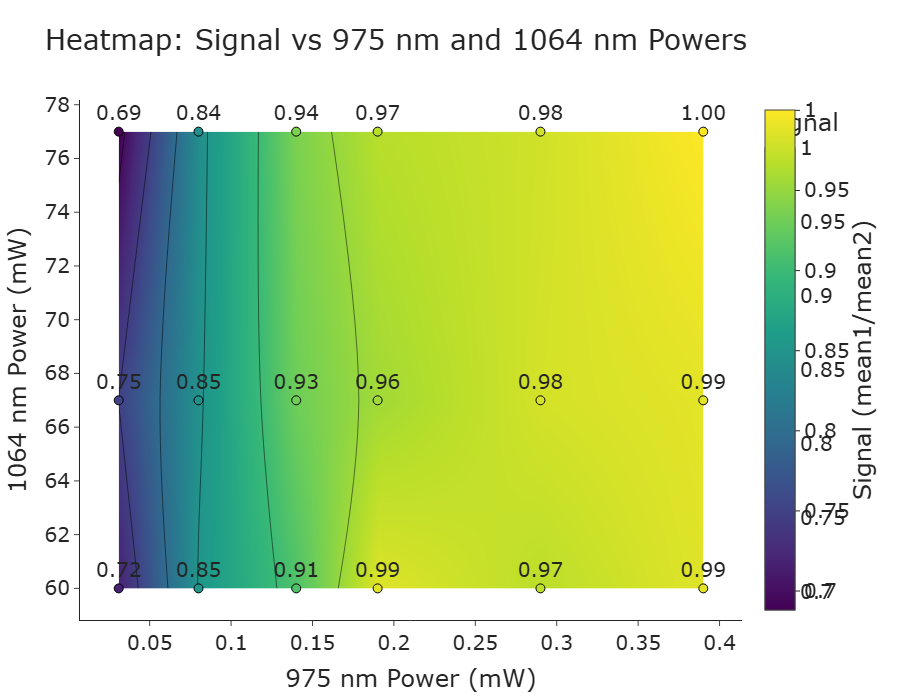

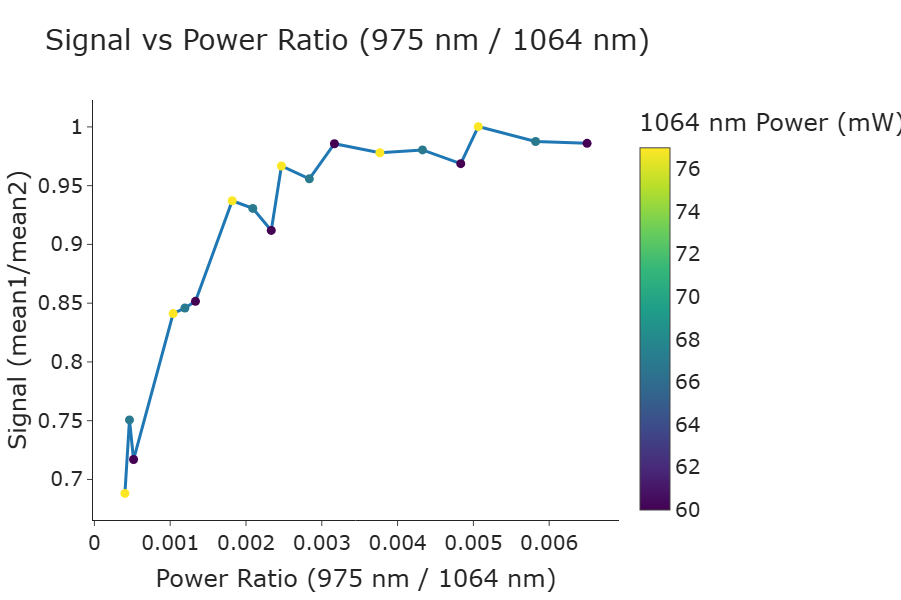

In [1]:
import os
import re
import numpy as np
import pandas as pd
import plotly.graph_objects as go

# ============================================================
# --- Root folder containing all 1064 nm subfolders ---
# ============================================================
root_folder = r"C:\Users\Atanu\OneDrive\Desktop\research_work\paper\NaBiF4_PL_analysis\datas\7th Oct NaBiF4\face on\good datas"

# --- Subfolders with corresponding 1064 nm current (mA) ---
subfolders = {
    "3.65": os.path.join(root_folder, "1064nm_3.65mA"),
    "3.75": os.path.join(root_folder, "1064nm_3.75mA"),
    "3.85": os.path.join(root_folder, "1064nm_3.85mA"),
}

# --- 1064 nm current → power calibration (mA → mW) ---
cal_1064 = {3: 36.65, 3.25: 43.6, 3.5: 53, 3.65: 60, 3.75: 67, 3.85: 77, 3.86: 77}

# --- 975 nm source → sample calibration (mW) ---
cal_975 = {
    0: 0, 1: 0.031, 2: 0.08, 3: 0.14, 4: 0.19, 5: 0.29, 6: 0.39, 7: 0.43,
    8: 0.47, 9: 0.61, 10: 0.61, 20: 1.3, 30: 2.3, 50: 3.3, 70: 4.5,
    90: 6.6, 110: 9.4, 130: 10.1, 150: 12.5, 170: 14.3, 190: 16.1,
    210: 18.7, 230: 21.3, 250: 22.3, 270: 25.7, 300: 22.34
}

# --- Time windows for ON/OFF signal groups (ms) ---
groups = [(15, 20), (40, 45), (65, 70), (90, 95)]

# ============================================================
# --- Helper function: extract 975 nm calibrated power from filename ---
# ============================================================
def extract_calibrated_power(filename):
    match = re.search(r'975nm_(\d+(?:\.\d+)?)mW', filename)
    if match:
        src_power = float(match.group(1))
        nearest_key = min(cal_975.keys(), key=lambda k: abs(k - src_power))
        return cal_975[nearest_key]
    return None

# ============================================================
# --- Loop through all data and compute Signal = mean(ON)/mean(OFF) ---
# ============================================================
all_results = []

for current, folder_path in subfolders.items():
    if not os.path.exists(folder_path):
        print(f"⚠️ Skipping missing folder: {folder_path}")
        continue

    for file_name in os.listdir(folder_path):
        if not file_name.endswith(('.txt', '.csv')):
            continue

        cal_power = extract_calibrated_power(file_name)
        if cal_power is None:
            continue

        file_path = os.path.join(folder_path, file_name)
        data = pd.read_csv(file_path, sep=None, engine='python')

        # Detect time column
        if "Time (ps)" in data.columns:
            data["Time (ms)"] = data["Time (ps)"] * 1e-9
        elif "Time (ms)" not in data.columns:
            continue

        # Extract data groups
        y_groups = []
        for tmin, tmax in groups:
            mask = (data["Time (ms)"] >= tmin) & (data["Time (ms)"] <= tmax)
            y_groups.append(data.loc[mask, "Counts per bin"].values)

        if any(len(y) == 0 for y in y_groups):
            continue

        group1 = np.concatenate([y_groups[0], y_groups[2]])  # ON
        group2 = np.concatenate([y_groups[1], y_groups[3]])  # OFF

        mean1, std1 = np.mean(group1), np.std(group1)
        mean2, std2 = np.mean(group2), np.std(group2)

        signal = mean1 / mean2 if mean2 != 0 else np.nan
        signal_std = (
            signal * np.sqrt((std1 / mean1) ** 2 + (std2 / mean2) ** 2)
            if mean1 > 0 and mean2 > 0 else np.nan
        )

        all_results.append({
            "1064_mA": float(current),
            "1064_mW": cal_1064.get(float(current), np.nan),
            "975_mW": cal_power,
            "Signal": signal,
            "Signal_std": signal_std
        })

# ============================================================
# --- Create DataFrame and Pivot Table for Heatmap ---
# ============================================================
df = pd.DataFrame(all_results)
df.sort_values(by=["975_mW", "1064_mA"], inplace=True)
df.reset_index(drop=True, inplace=True)

# Add ratio column (975 nm / 1064 nm)
df["Power_Ratio"] = df["975_mW"] / df["1064_mW"]

# Pivot for heatmap (rows = 1064 mW, columns = 975 mW)
pivot_df = df.pivot_table(index="1064_mW", columns="975_mW", values="Signal", aggfunc="mean")
pivot_df = pivot_df.sort_index()

# ============================================================
# --- Heatmap (Contour) Plot with Data Points ---
# ============================================================
fig = go.Figure()

# Contour heatmap
fig.add_trace(go.Contour(
    x=pivot_df.columns,         # 975 nm powers
    y=pivot_df.index,           # 1064 nm powers
    z=pivot_df.values,          # Signal
    contours_coloring='heatmap',
    connectgaps=False,
    line_smoothing=1,
    coloraxis='coloraxis',
    name="Interpolated Surface"
))

# Add actual data points on top
fig.add_trace(go.Scatter(
    x=df["975_mW"],
    y=df["1064_mW"],
    mode='markers+text',
    text=[f"{s:.2f}" for s in df["Signal"]],
    textposition="top center",
    marker=dict(
        size=9,
        color=df["Signal"],
        colorscale='Viridis',
        line=dict(width=1, color='black'),
        colorbar=dict(title="Signal")
    ),
    name="Measured Points"
))

fig.update_layout(
    template='simple_white+presentation',
    title="Heatmap: Signal vs 975 nm and 1064 nm Powers",
    xaxis_title="975 nm Power (mW)",
    yaxis_title="1064 nm Power (mW)",
    width=900,
    height=700,
    coloraxis={
        'colorscale': 'Viridis',
        'cmin': np.nanmin(pivot_df.values),
        'cmax': np.nanmax(pivot_df.values),
        'showscale': True,
        'colorbar': {'title': 'Signal (mean1/mean2)', 'titleside': 'right'}
    },
    font=dict(size=20)
)

fig.show()

# ============================================================
# --- 2D Plot: Signal vs Power Ratio (975/1064) ---
# ============================================================

# Sort by ratio and average duplicates
ratio_df = (
    df.groupby("Power_Ratio", as_index=False)
      .agg({"Signal": "mean", "1064_mW": "mean"})
      .sort_values(by="Power_Ratio")
)

fig2 = go.Figure()

fig2.add_trace(go.Scatter(
    x=ratio_df["Power_Ratio"],
    y=ratio_df["Signal"],
    mode='markers+lines',
    marker=dict(
        size=9,
        color=ratio_df["1064_mW"],
        colorscale='Viridis',
        colorbar=dict(title="1064 nm Power (mW)")
    ),
    name="Signal vs Power Ratio"
))

fig2.update_layout(
    template='simple_white+presentation',
    title="Signal vs Power Ratio (975 nm / 1064 nm)",
    xaxis_title="Power Ratio (975 nm / 1064 nm)",
    yaxis_title="Signal (mean1/mean2)",
    width=900,
    height=600,
    font=dict(size=20)
)

fig2.show()
